In [2]:
import random

import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
import lightkurve as lk
import pbjam as pb
import scipy.signal as sig
from scipy import interpolate, fftpack
from scipy.signal.windows import dpss
from astropy.io import fits
from astropy.timeseries.periodograms import LombScargle

from multitaper.mtls import dpss_interp, mtls_spec
%matplotlib inline

# Evenly-sampled DPSS
Scipy provides a ``dpss`` function that computes DPSS tapers using the tridiagonal method.

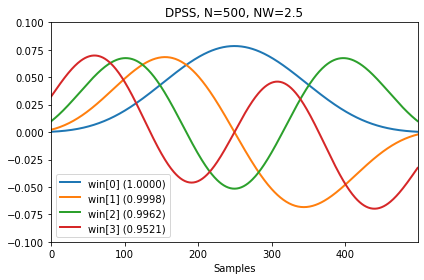

In [38]:
N = 500
NW = 2.5
K = int(2*NW-1)
win, eigvals = dpss(N, NW, K, return_ratios=True)

fig, ax = plt.subplots(1, figsize=(6, 4))
ax.plot(win.T, linewidth=2.)
ax.set(xlim=[0, N-1], ylim=[-0.1, 0.1], xlabel='Samples',
       title='DPSS, N=%d, NW=%0.1f' % (N, NW))
ax.legend(['win[%d] (%0.4f)' % (ii, ratio)
           for ii, ratio in enumerate(eigvals)])
fig.tight_layout()

# Unevenly sampled DPSS

Evenly sampled DPSS are interpolated using spline interpolation

In [39]:
t_even = np.arange(600)

# Delete 150 random entries
rand_ind = random.sample(range(0, 600), 100)
t_uneven = np.delete(t_even, rand_ind)

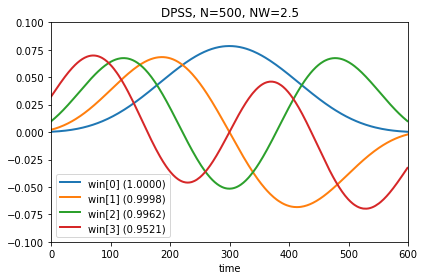

In [40]:
win_uneven, eigvals_uneven = dpss_interp(t_uneven, NW=2.5, K=4)

fig, ax = plt.subplots(1, figsize=(6, 4))
ax.plot(t_uneven, win_uneven.T, linewidth=2.)
ax.set_xlabel('time')

ax.set(xlim=[0, 600], ylim=[-0.1, 0.1],
       title='DPSS, N=%d, NW=%0.1f' % (len(t_uneven), NW))
ax.legend(['win[%d] (%0.4f)' % (ii, ratio)
           for ii, ratio in enumerate(eigvals_uneven)])
fig.tight_layout()

# Rectangular vs DPSS window

Text(0, 0.5, 'Relative attenuation')

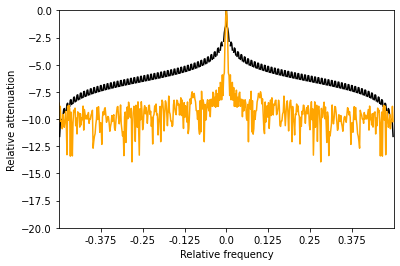

In [56]:
# Rectangular Window
b = sig.boxcar(N)
zfrac = 0.1
zi = int(N * zfrac)
b[:zi] = b[-zi:] = 0
b = fftpack.fft(b)
b = np.abs(fftpack.fftshift(b).real)
b /= np.max(b)
b = np.log(b)

# DPSS uneven 0th order window
wf_0 = fftpack.fft(win_uneven[0])
wf_0 = np.abs(fftpack.fftshift(wf_0).real)
wf_0 /= np.max(wf_0)
wf_0 = np.log(wf_0)

plt.figure(figsize=(6, 4))
plt.plot(b, color='black')
plt.plot(wf_0, color='orange')
plt.xlim(0, N)
plt.ylim([-20, 0])
plt.xticks(np.arange(N/8., N, N/8.), np.arange((-1/2.+1/8.), 1/2., 1/8.))
plt.xlabel('Relative frequency')
plt.ylabel('Relative attenuation')

# Sinusoid signal

In [57]:
signal = np.sin(0.1*2*np.pi*t_uneven) + np.sin(0.12*2*np.pi*t_uneven) +\
         0.2 * np.random.randn(t_uneven.shape[0])

Text(0, 0.5, 'Power')

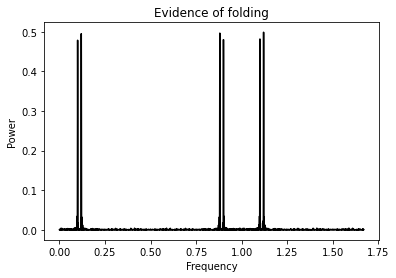

In [58]:
freq, spec = LombScargle(t_uneven, signal).autopower(method='fast', nyquist_factor=4)

plt.plot(freq, spec, color='black')
plt.title('Evidence of folding')
plt.xlabel('Frequency')
plt.ylabel('Power')

# Asteroseismology 

In [59]:
# Read the asteroseismology data

kepler_rgb = np.loadtxt('data/koi2133.lp.ts')

Text(0, 0.5, 'Flux')

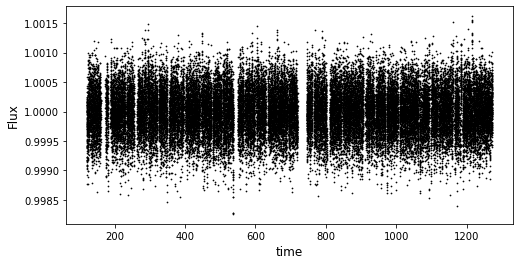

In [60]:
plt.figure(figsize=(8, 4))
plt.scatter(kepler_rgb[:, 0], kepler_rgb[:, 1], color='black',
            s = 0.5)
plt.xlabel('time', fontsize=12)
plt.ylabel('Flux', fontsize=12)

## Pseudo-window

Text(0.5, 0, 'Frequency (1/day)')

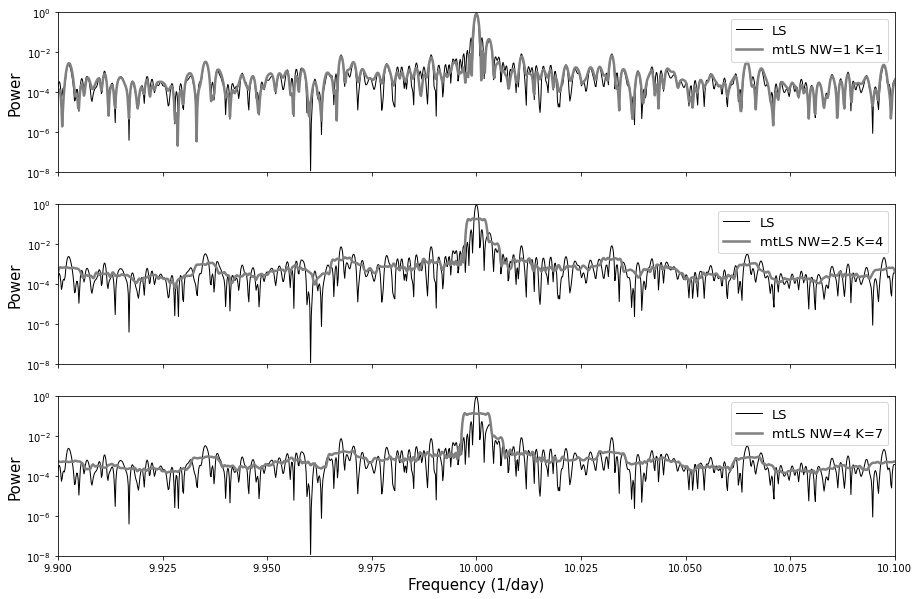

In [64]:
# Spectral leakage properties through pseudo-windows
sig = 1*np.sin(10*2*np.pi*kepler_rgb[:, 0]) + 0.25*np.sin(10.003*2*np.pi*kepler_rgb[:, 0])

freq, spec = LombScargle(kepler_rgb[:, 0]*u.day, sig).autopower(method='fast', nyquist_factor=1)

freqMT_1, specMT_1 = mtls_spec(kepler_rgb[:, 0]*u.day, sig, NW=1, K=1, adaptive_weighting=False)
freqMT_5, specMT_5 = mtls_spec(kepler_rgb[:, 0]*u.day, sig, NW=3, K=5, adaptive_weighting=False)
freqMT_7, specMT_7 = mtls_spec(kepler_rgb[:, 0]*u.day, sig, NW=4, K=7, adaptive_weighting=False)

freq = freq.to(1/u.day)
freqMT_1 = freqMT_1.to(1/u.day)
freqMT_5 = freqMT_5.to(1/u.day)
freqMT_7 = freqMT_7.to(1/u.day)

fig, ax = plt.subplots(3, 1, figsize=(15, 10), sharex=True)
ax[0].plot(freq, spec, label='LS', color='black', linewidth=1)
ax[0].plot(freqMT_1, specMT_1, label='mtLS NW=1 K=1', color='grey', linewidth=2.5)
ax[0].set_yscale('log')
ax[0].set_ylim([10**(-8), 10**0])
ax[0].set_ylabel('Power', fontsize=15)
ax[0].legend(fontsize=13)

ax[1].plot(freq, spec, label='LS', color='black', linewidth=1)
ax[1].plot(freqMT_5, specMT_5, label='mtLS NW=2.5 K=4', color='grey', linewidth=2.5)
ax[1].set_yscale('log')
ax[1].set_ylim([10**(-8), 10**0])
ax[1].set_ylabel('Power', fontsize=15)
ax[1].legend(fontsize=13)

ax[2].plot(freq, spec, label='LS', color='black', linewidth=1)
ax[2].plot(freqMT_7, specMT_7, label='mtLS NW=4 K=7', color='grey', linewidth=2.5)
ax[2].set_yscale('log')
ax[2].set_ylim([10**(-8), 10**0])
ax[2].set_ylabel('Power', fontsize=15)
ax[2].legend(fontsize=13)

ax[-1].set_xlim([9.9, 10.1])
ax[-1].set_xlabel('Frequency (1/day)', fontsize=15)

Text(0.5, 0, 'Frequency ($\\mu$Hz)')

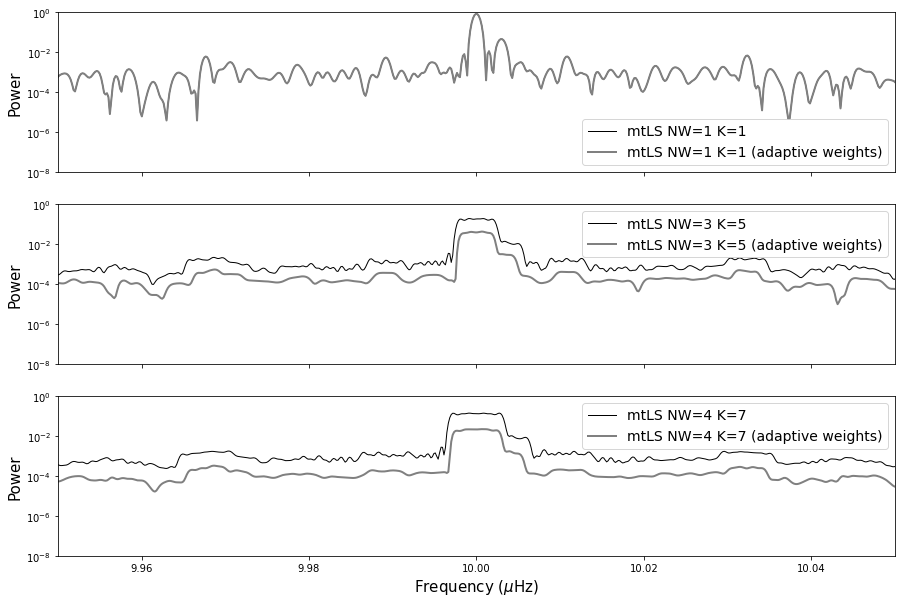

In [65]:
freqMT_1_weight, specMT_1_weight = mtls_spec(kepler_rgb[:, 0]*u.day, sig, NW=1, K=1, adaptive_weighting=True)
freqMT_5_weight, specMT_5_weight = mtls_spec(kepler_rgb[:, 0]*u.day, sig, NW=3, K=5, adaptive_weighting=True)
freqMT_7_weight, specMT_7_weight = mtls_spec(kepler_rgb[:, 0]*u.day, sig, NW=4, K=7, adaptive_weighting=True)

freqMT_1_weight = freqMT_1_weight.to(1/u.day)
freqMT_5_weight = freqMT_5_weight.to(1/u.day)
freqMT_7_weight = freqMT_7_weight.to(1/u.day)

fig, ax = plt.subplots(3, 1, figsize=(15, 10), sharex=True)
ax[0].plot(freqMT_1, specMT_1, label='mtLS NW=1 K=1',
           color='black', linewidth=1)
ax[0].plot(freqMT_1_weight, specMT_1_weight, label='mtLS NW=1 K=1 (adaptive weights)',
           color='grey', linewidth=2)
ax[0].set_yscale('log')
ax[0].set_ylim([10**(-8), 10**0])
ax[0].set_ylabel('Power', fontsize=15)
ax[0].legend(fontsize=14)

ax[1].plot(freqMT_5, specMT_5, label='mtLS NW=3 K=5',
           color='black', linewidth=1)
ax[1].plot(freqMT_5_weight, specMT_5_weight, label='mtLS NW=3 K=5 (adaptive weights)',
           color='grey', linewidth=2)
ax[1].set_yscale('log')
ax[1].set_ylim([10**(-8), 10**0])
ax[1].set_ylabel('Power', fontsize=15)
ax[1].legend(fontsize=14)

ax[2].plot(freqMT_7, specMT_7, label='mtLS NW=4 K=7',
           color='black', linewidth=1)
ax[2].plot(freqMT_7_weight, specMT_7_weight, label='mtLS NW=4 K=7 (adaptive weights)',
           color='grey', linewidth=2)
ax[2].set_yscale('log')
ax[2].set_ylim([10**(-8), 10**0])
ax[2].set_ylabel('Power', fontsize=15)
ax[2].legend(fontsize=14)

ax[-1].set_xlim([9.95, 10.05])
ax[-1].set_xlabel(r'Frequency ($\mu$Hz)', fontsize=15)

## Power Spectrum

In [67]:
freq, power = LombScargle(kepler_rgb[:, 0]*u.day, kepler_rgb[:, 1]).autopower(method='fast', nyquist_factor=1)
freqMT, powerMT = mtls_spec(kepler_rgb[:, 0]*u.day, kepler_rgb[:, 1],
                          center_data=True, NW=4, K=7, nyquist_factor=1)

freq = freq.to(u.uHz)
freqMT = freqMT.to(u.uHz)

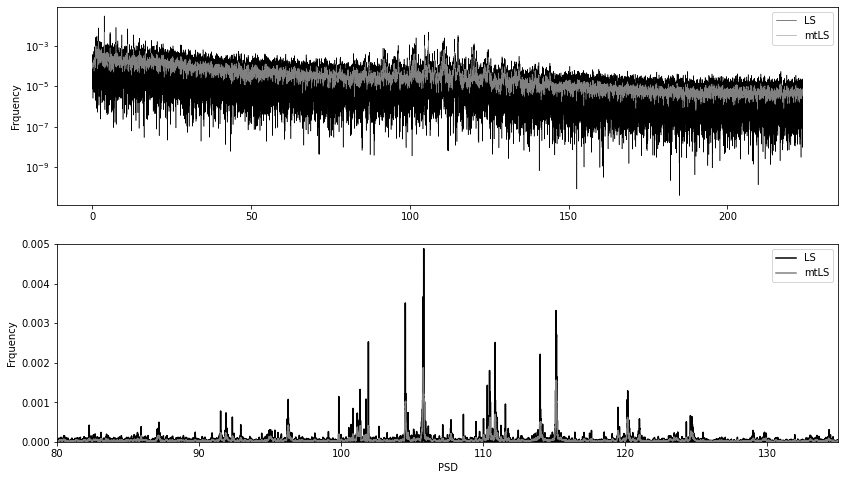

In [68]:
fig, ax = plt.subplots(2, 1, figsize=(14, 8))
ax[0].plot(freq, power, color='black', label='LS',
         linewidth=0.5)
ax[0].plot(freqMT, powerMT, color='grey', label='mtLS',
         linewidth=0.5)
ax[0].set_yscale('log')
ax[0].set_ylabel('Frquency')
ax[0].legend()

ax[1].plot(freq, power, color='black', label='LS',
           linewidth=1.5)
ax[1].plot(freqMT, powerMT, color='grey', label='mtLS',
           linewidth=1.5)
ax[1].set_ylabel('Frquency')
ax[1].set_xlim([80, 135])
ax[1].set_ylim([0.0, 0.005])
ax[1].set_xlabel('PSD')
ax[1].legend()

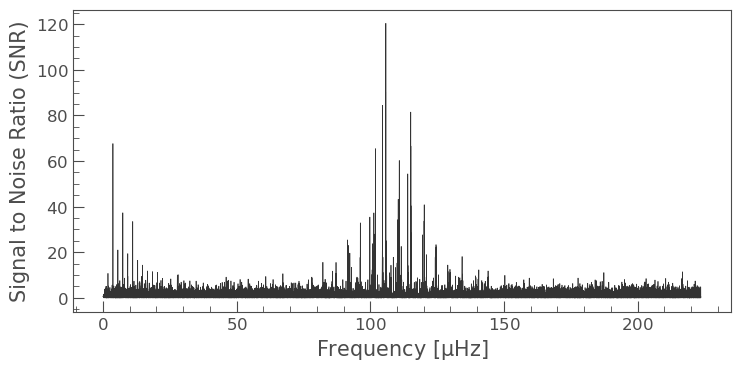

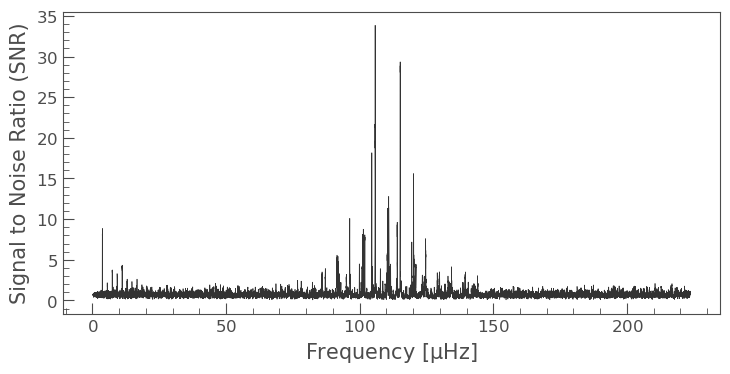

In [69]:
power_Q = u.Quantity(power)
powerMT_Q = u.Quantity(powerMT)

pg = lk.periodogram.Periodogram(frequency=freq, power=power_Q)
pg = pg.flatten()
pg.plot()

pg_mt = lk.periodogram.Periodogram(frequency=freqMT, power=powerMT_Q)
pg_mt = pg_mt.flatten()
pg_mt.plot()

## Peak-bagging using LS

Starting KDE estimation
Steps taken: 2000
Steps taken: 3000
Steps taken: 4000
Steps taken: 5000
Steps taken: 6000
Steps taken: 7000
Steps taken: 8000
Chains reached stationary state after 8000 iterations.


No handles with labels found to put in legend.


Starting asymptotic peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/asy_peakbag.py:383: UserWarning: Method mcmc not found: Using method mcmc
  warnings.warn(f'Method {method} not found: Using method mcmc')


Steps taken: 2000
Chains reached stationary state after 2000 iterations.
Starting peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pymc3/sampling.py:465: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [back, height2, height0, l2, l0, width2, width0]
Sampling 2 chains for 1_500 tune and 1_000 draw iterations (3_000 + 2_000 draws total) took 119 seconds.
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:88: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(
/Users/aaryapatil/opt/anaconda3/lib/python3.8/s

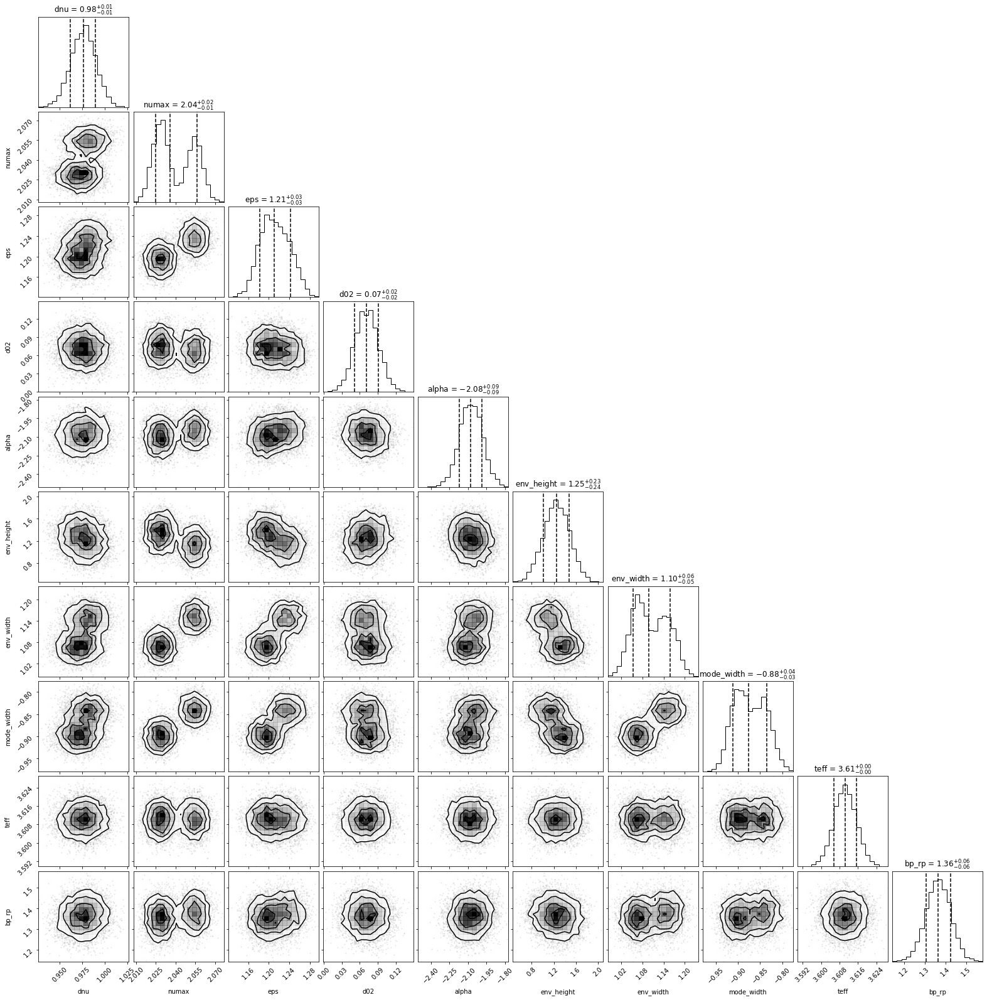

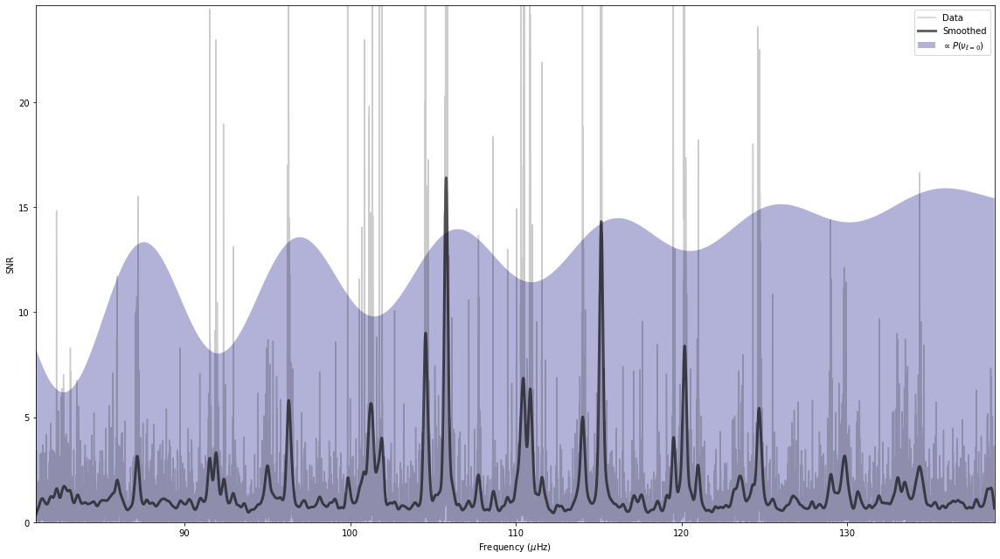

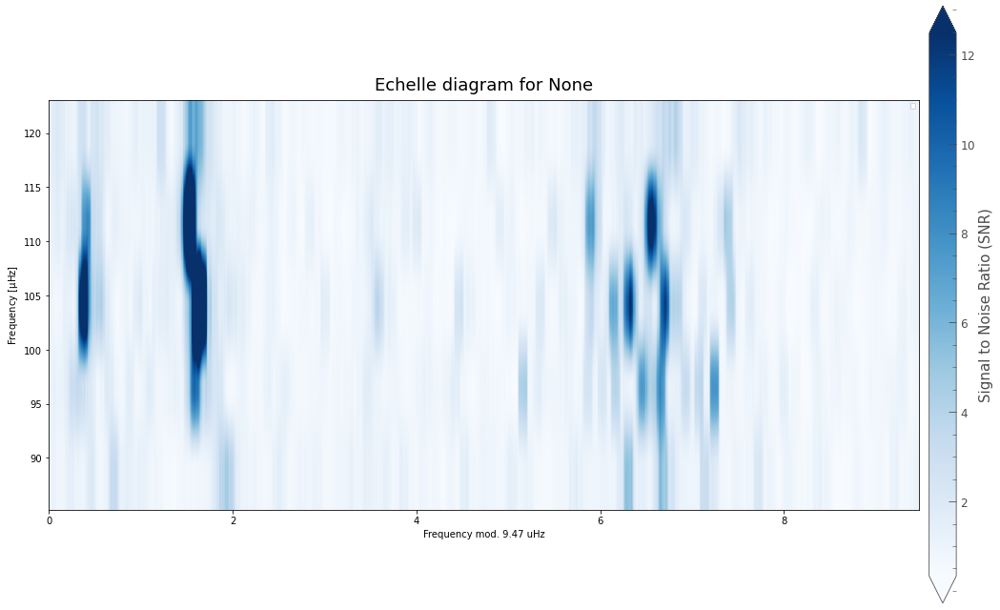

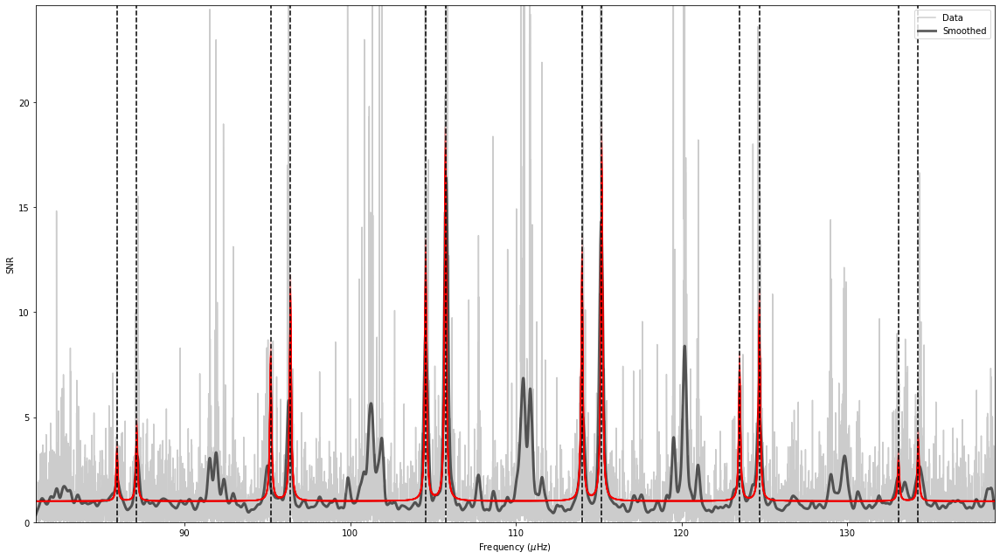

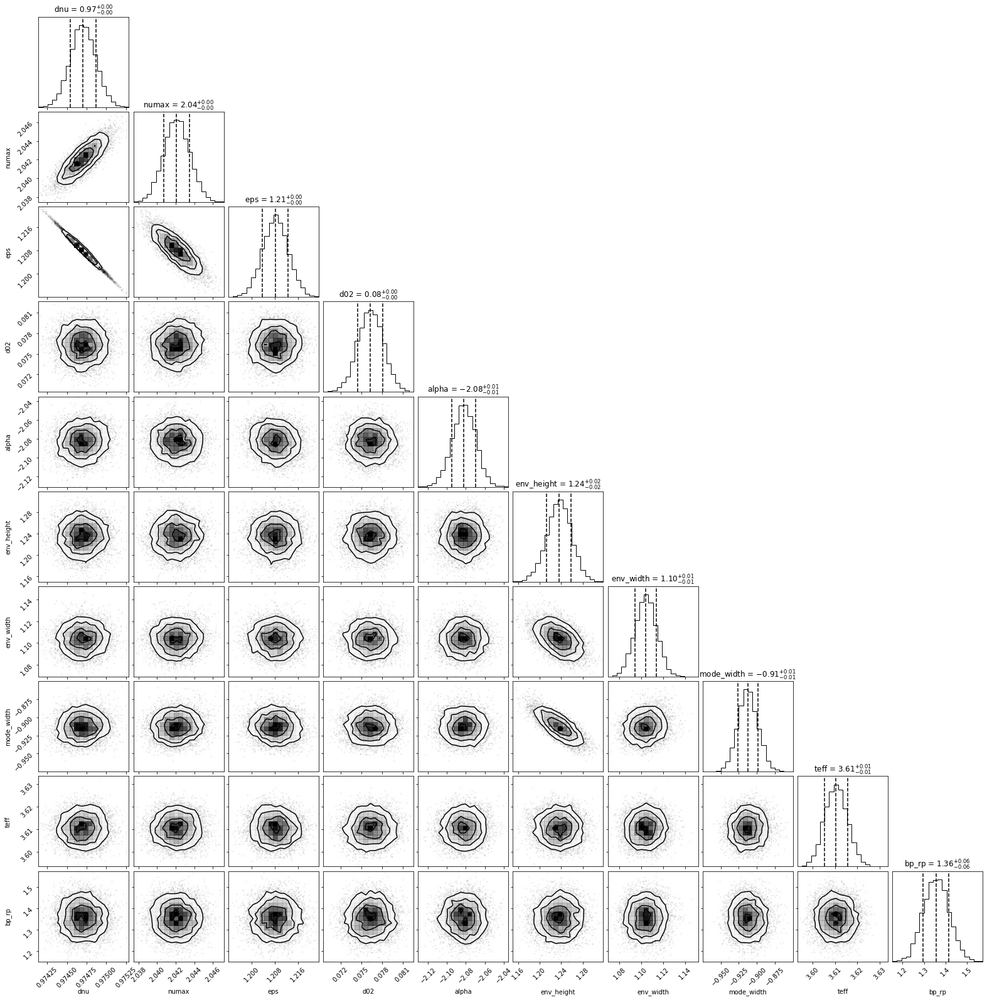

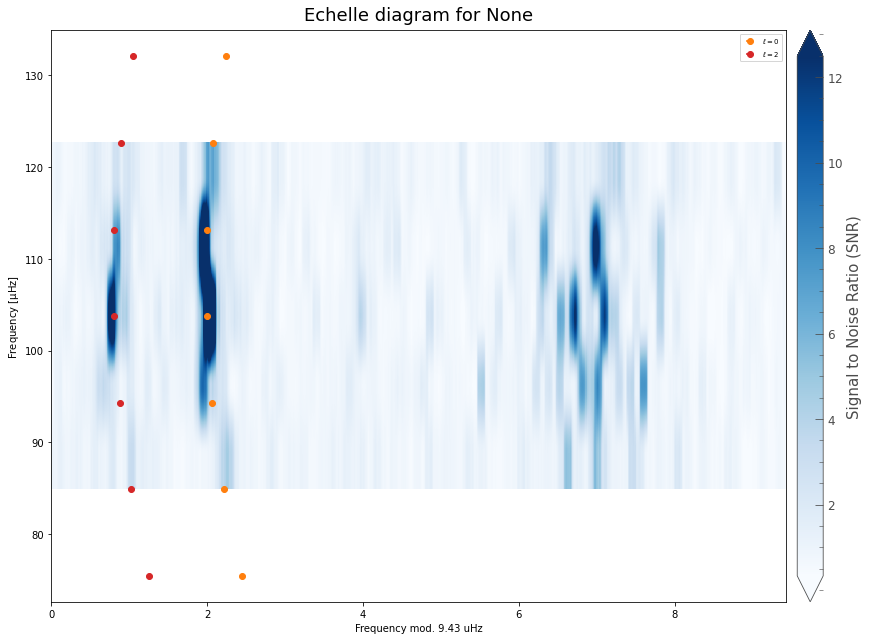

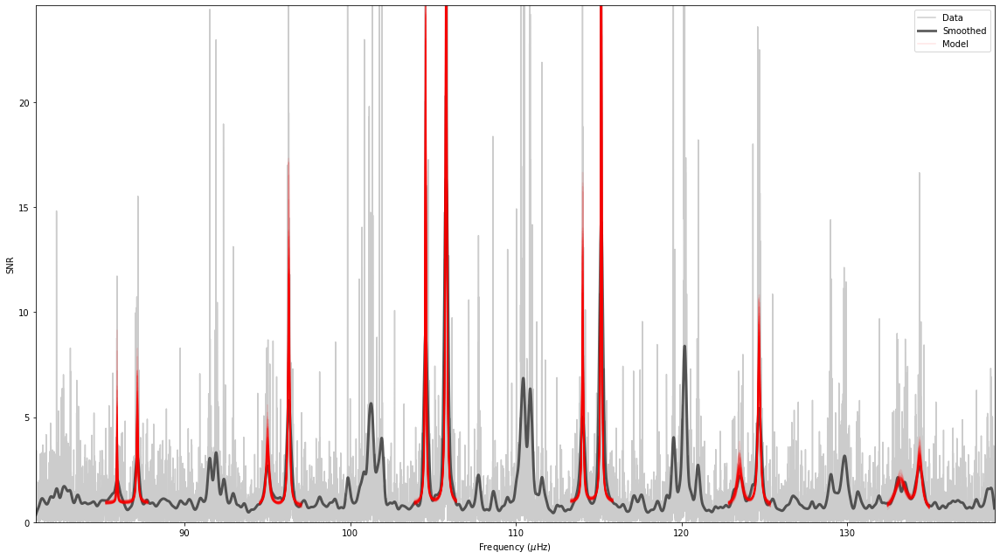

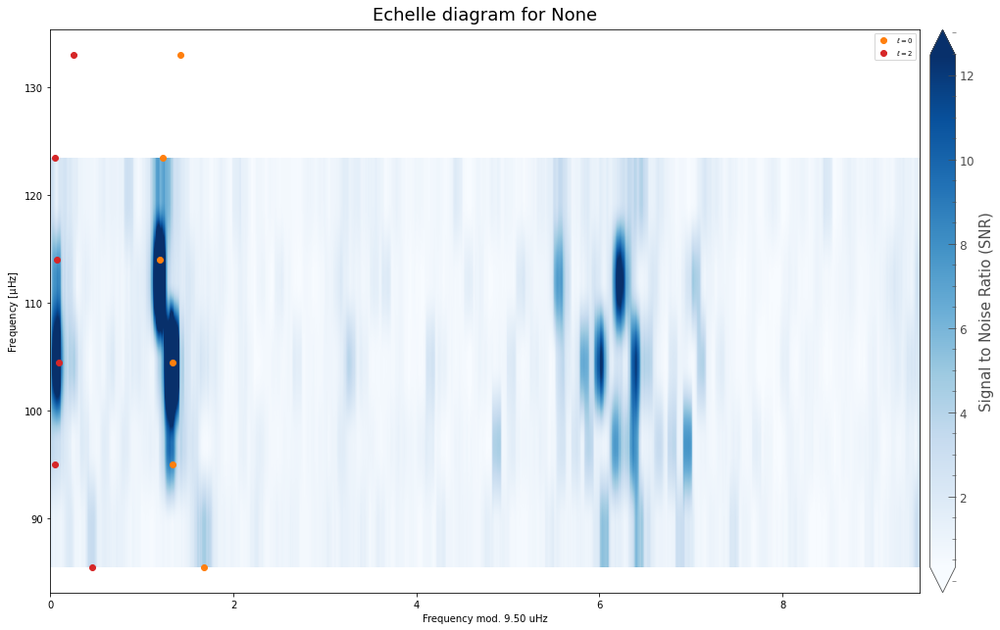

In [26]:
ID = 'KOI2133'
numax = (110, 8.0)
dnu = (10, 2)
teff = (4000, 50)
bp_rp = (1.34, 0.1)

st = pb.star(ID, pg, numax, dnu, teff, bp_rp)
st(norders = 7, make_plots=True)

## Peak-bagging using multitaper LS

Starting KDE estimation
Steps taken: 2000
Steps taken: 3000
Chains reached stationary state after 3000 iterations.


No handles with labels found to put in legend.


Starting asymptotic peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/asy_peakbag.py:383: UserWarning: Method mcmc not found: Using method mcmc
  warnings.warn(f'Method {method} not found: Using method mcmc')


Steps taken: 2000
Chains reached stationary state after 2000 iterations.
Starting peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pymc3/sampling.py:465: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [back, height2, height0, l2, l0, width2, width0]
Sampling 1 chain for 1_500 tune and 893 draw iterations (1_500 + 893 draws total) took 58 seconds.
Only one chain was sampled, this makes it impossible to run some convergence checks
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:88: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a m

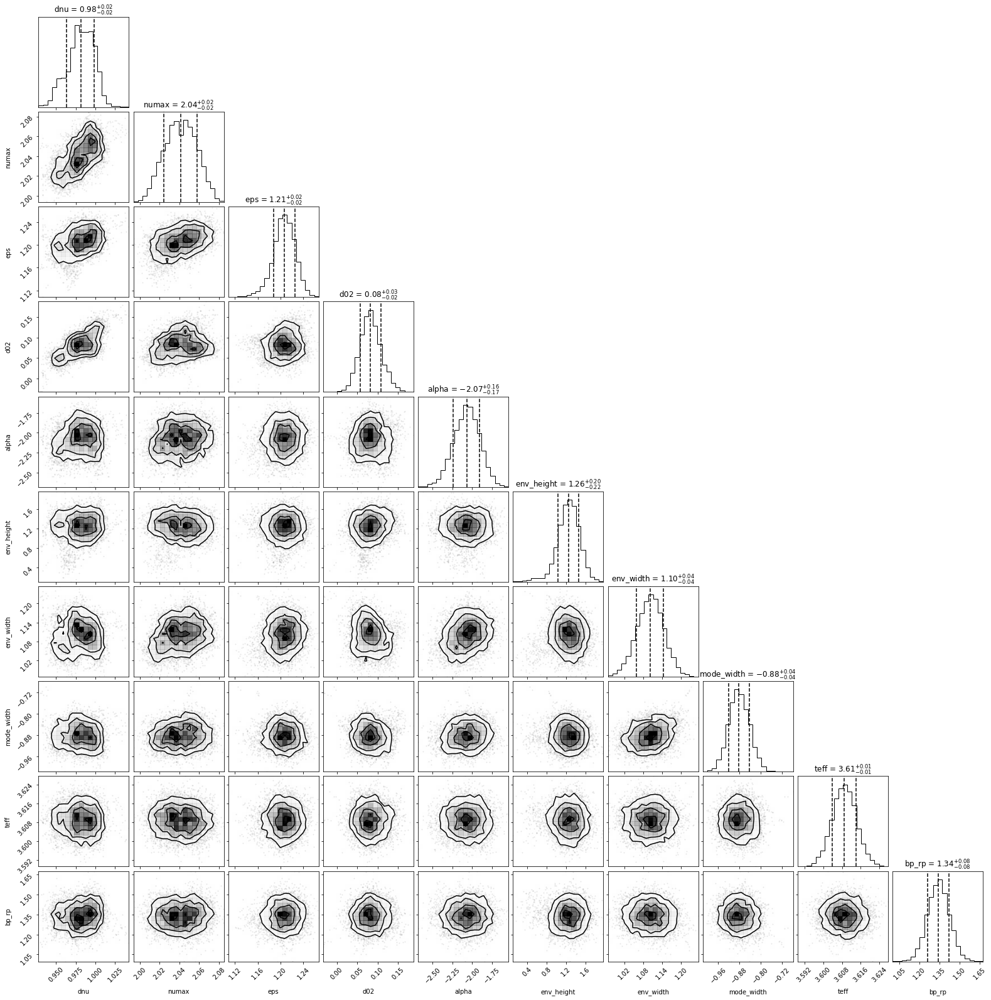

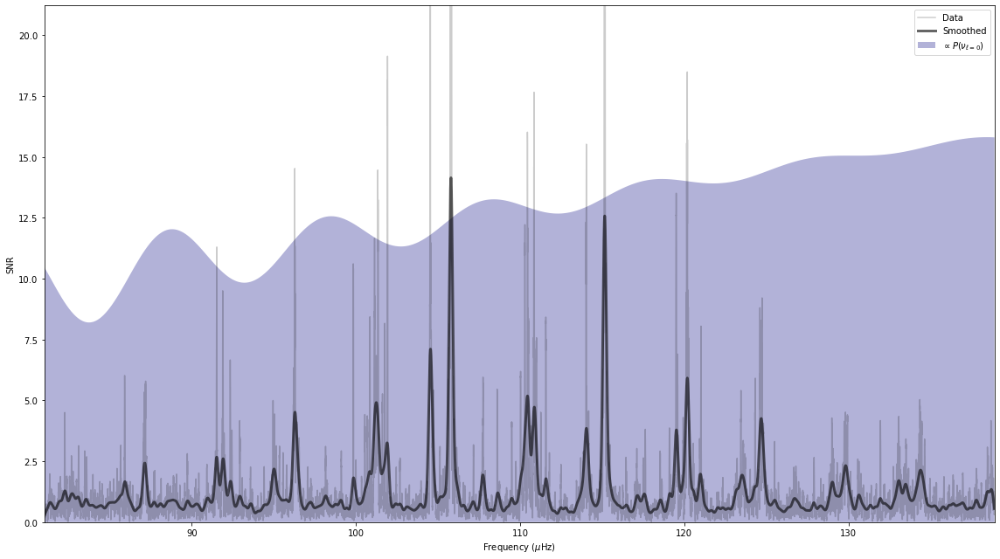

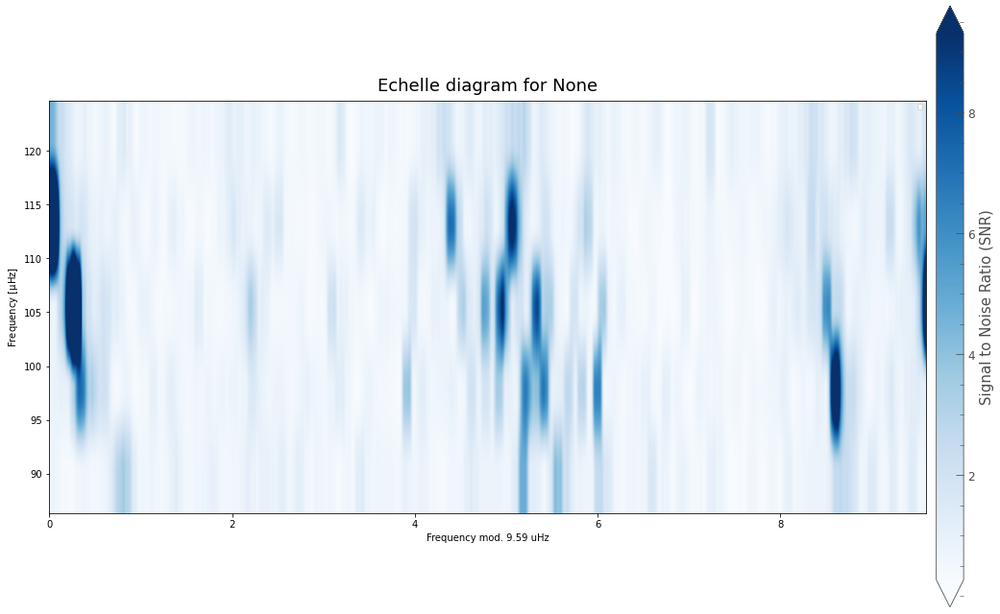

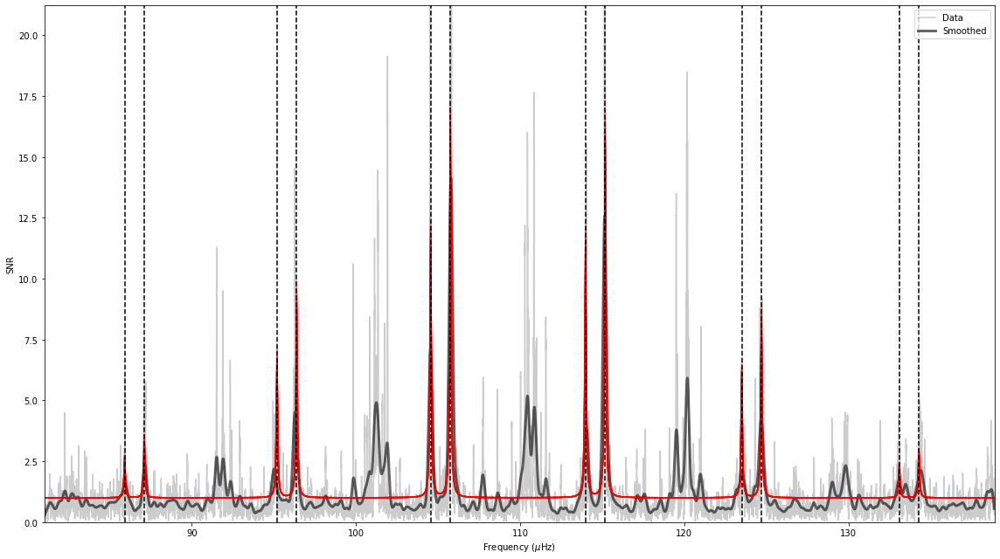

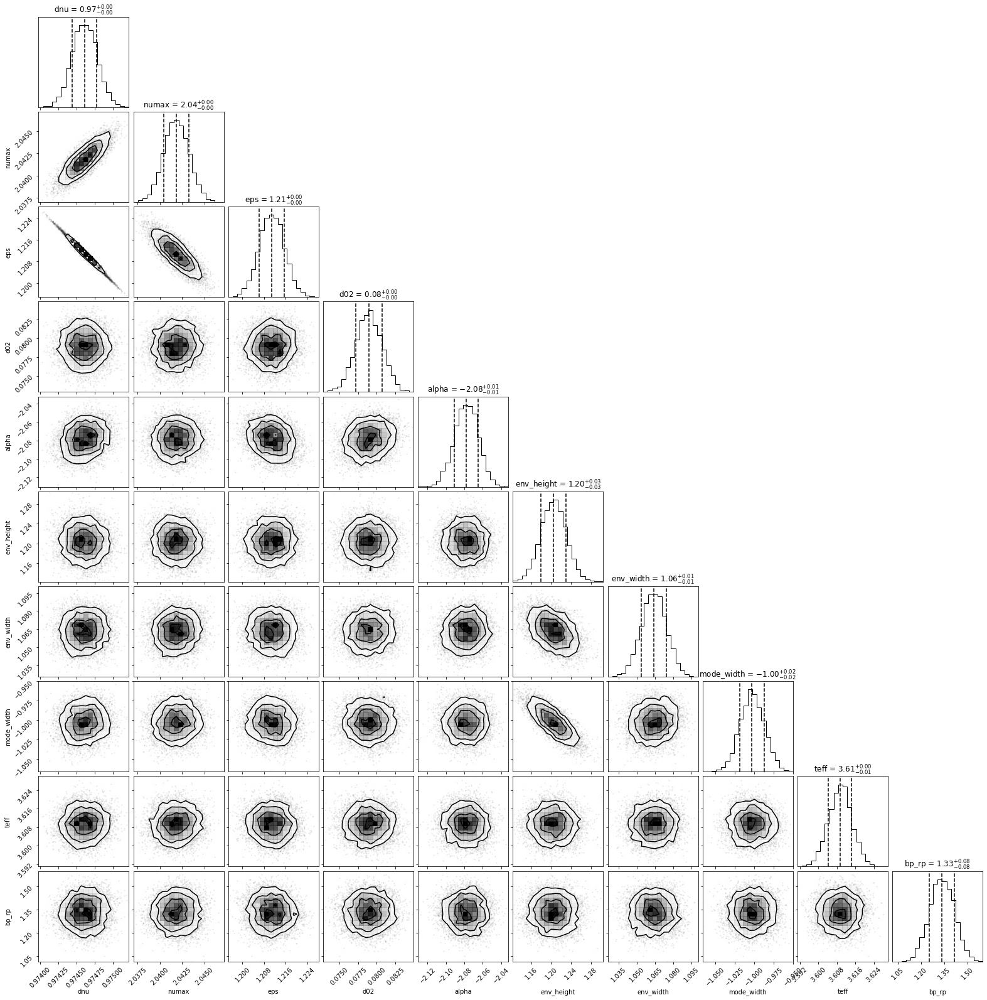

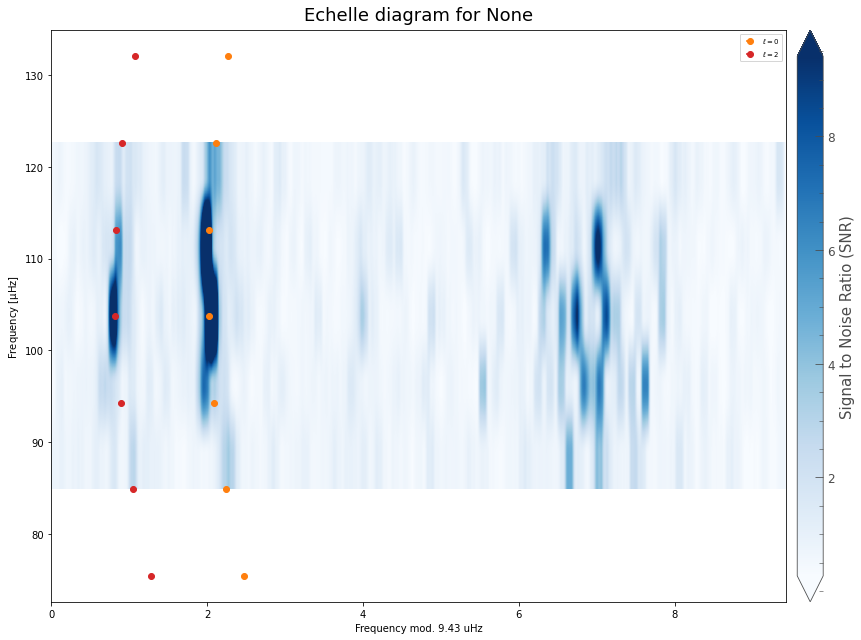

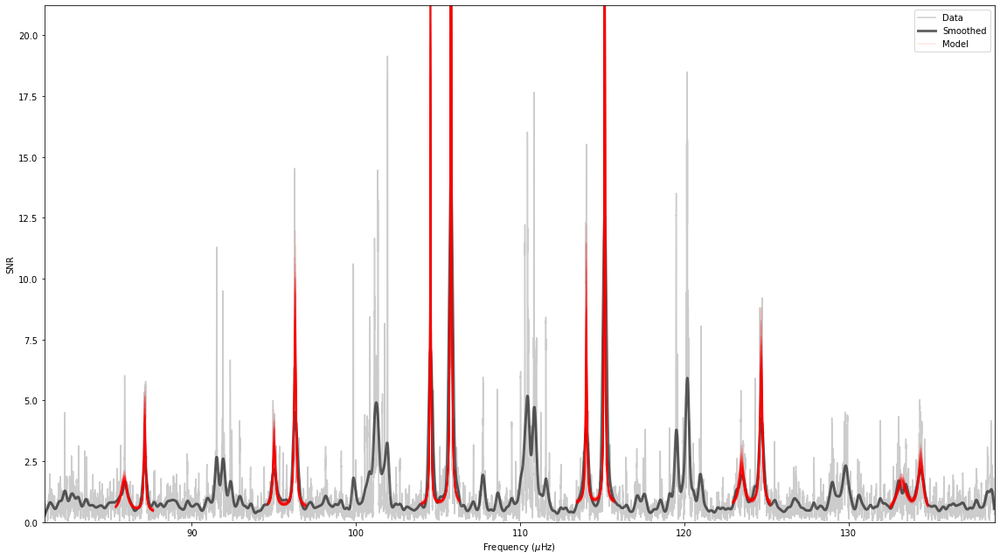

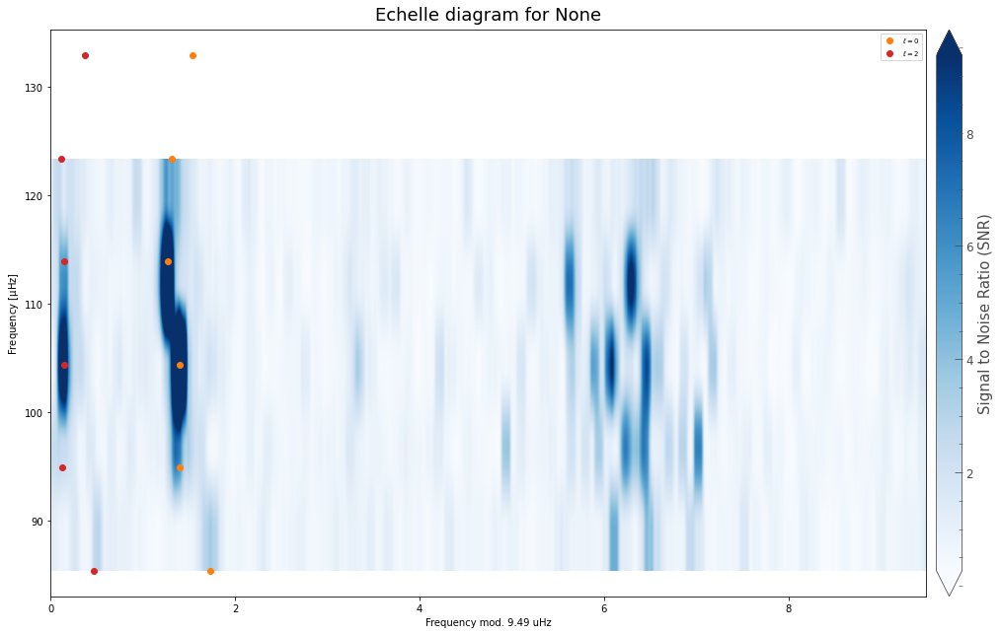

In [50]:
ID = 'KOI2133'
numax = (110, 8.0)
dnu = (10, 2)
teff = (4000, 50)
bp_rp = (1.34, 0.1)

st = pb.star(ID, pg_mt, numax, dnu, teff, bp_rp)
st(norders = 7, make_plots=True)


# TESS simulated lightcurve

Text(0, 0.5, 'Flux')

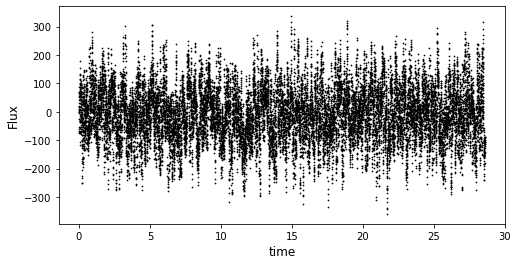

In [3]:
# TESS hduimulated lightcurve
hdu = fits.open('../AADG3-stable/s4tess_sector_01/00014_01_0001.fits')
star_info = hdu[0].header
timeseries = hdu[1].data
modes = hdu[2].data

plt.figure(figsize=(8, 4))
plt.scatter(timeseries['TIME'], timeseries['FLUX'], color='black',
            s = 0.5)
plt.xlabel('time', fontsize=12)
plt.ylabel('Flux', fontsize=12)


Text(0, 0.5, 'Flux')

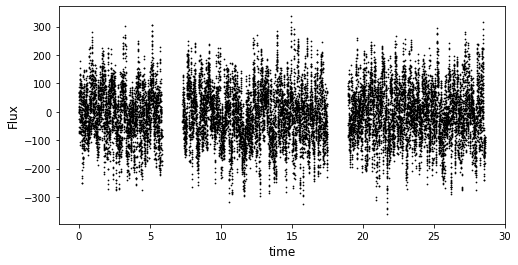

In [4]:
# Delete 1000 random entries
rand_ind = random.sample(range(0, len(timeseries['TIME'])), 1000)
time = np.delete(timeseries['TIME'], rand_ind)
flux = np.delete(timeseries['FLUX'], rand_ind)

# Create gaps
time = np.delete(time, np.arange(4000, 5000))
flux = np.delete(flux, np.arange(4000, 5000))
time = np.delete(time, np.arange(11000, 12000))
flux = np.delete(flux, np.arange(11000, 12000))

plt.figure(figsize=(8, 4))
plt.scatter(time, flux, color='black',
            s = 0.5)
plt.xlabel('time', fontsize=12)
plt.ylabel('Flux', fontsize=12)


## Power Spectrum

In [5]:
freq, power = LombScargle(time*u.day, flux).autopower(method='fast', nyquist_factor=1)
freqMT, powerMT = mtls_spec(time*u.day, flux, center_data=True,
                            NW=4, K=7, nyquist_factor=1)

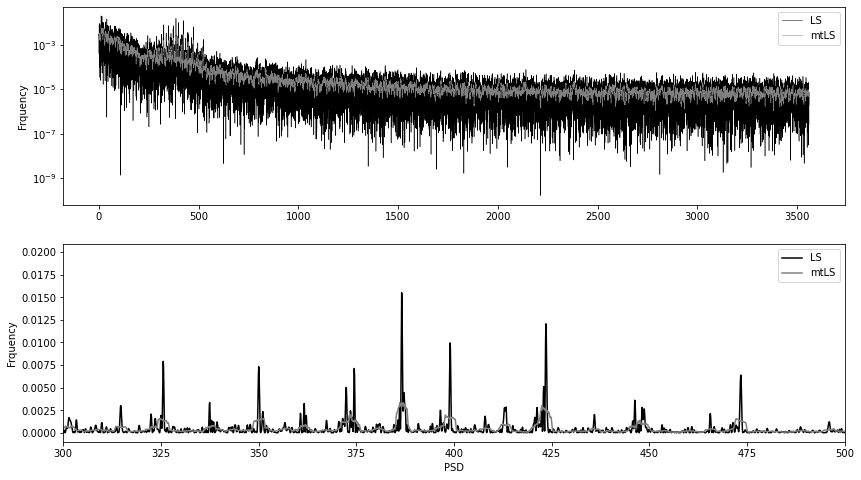

In [6]:
fig, ax = plt.subplots(2, 1, figsize=(14, 8))
ax[0].plot(freq.to(u.uHz), power, color='black', label='LS',
         linewidth=0.5)
ax[0].plot(freqMT.to(u.uHz), powerMT, color='grey', label='mtLS',
         linewidth=0.5)
ax[0].set_yscale('log')
ax[0].set_ylabel('Frquency')
ax[0].legend()

ax[1].plot(freq.to(u.uHz), power, color='black', label='LS',
           linewidth=1.5)
ax[1].plot(freqMT.to(u.uHz), powerMT, color='grey', label='mtLS',
           linewidth=1.5)
ax[1].set_xlim([300, 500])
ax[1].set_ylabel('Frquency')
ax[1].set_xlabel('PSD')
ax[1].legend()

## Smoothed Periodogram

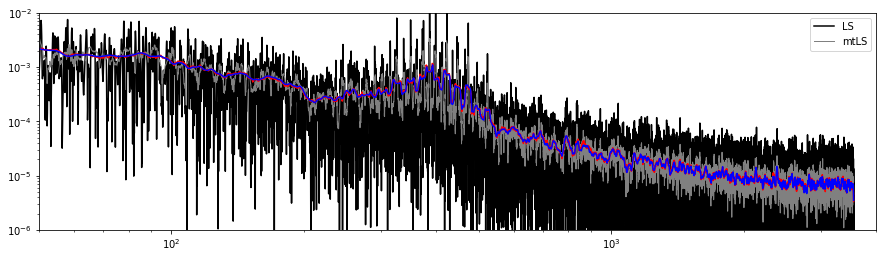

In [13]:
pg = lk.periodogram.Periodogram(frequency=freq.to(u.uHz), power=power)
pg_mt = lk.periodogram.Periodogram(frequency=freqMT.to(u.uHz), power=powerMT)

pg_smooth = pg.smooth(method='boxkernel', filter_width=15)
pg_mt_smooth = pg_mt.smooth(method='boxkernel', filter_width=15)

plt.figure(figsize=(15, 4))
plt.plot(pg.frequency, pg.power, color='black', label='LS')
plt.plot(pg_mt.frequency, pg_mt.power, color='grey', label='mtLS', linewidth=1)
plt.plot(pg_smooth.frequency, pg_smooth.power, color='red')
plt.plot(pg_mt_smooth.frequency, pg_mt_smooth.power, color='blue')
plt.xscale('log')
plt.yscale('log')
plt.xlim([50, 4*10**3])
plt.ylim([10**(-6), 10**(-2)])
plt.legend()

(10.0, 1000.0)

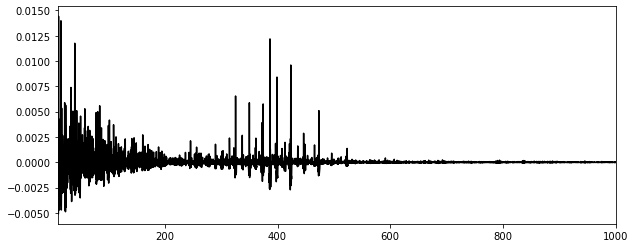

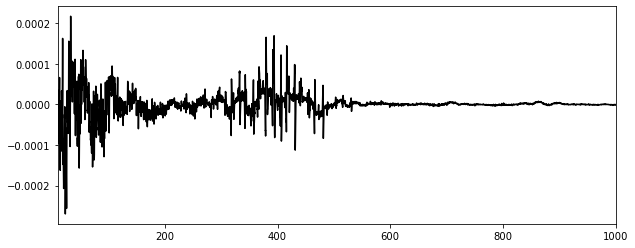

In [17]:
plt.figure(figsize=(10, 4))
plt.plot(pg.frequency, pg.power.value - pg_mt.power.value, color='black')
plt.xlim(10, 1000)

plt.figure(figsize=(10, 4))
plt.plot(pg_smooth.frequency, pg_smooth.power.value - pg_mt_smooth.power.value, color='black')
plt.xlim(10, 1000)

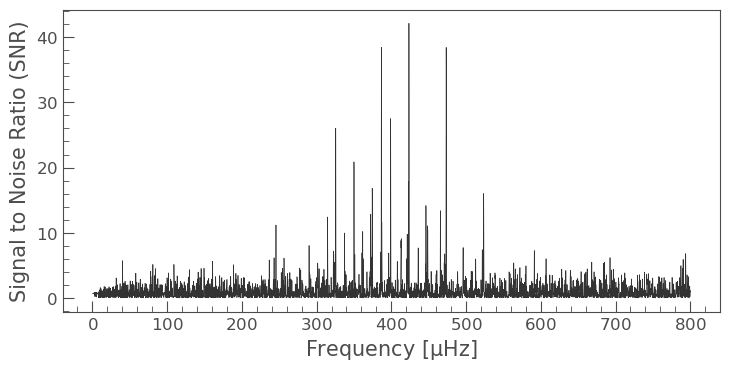

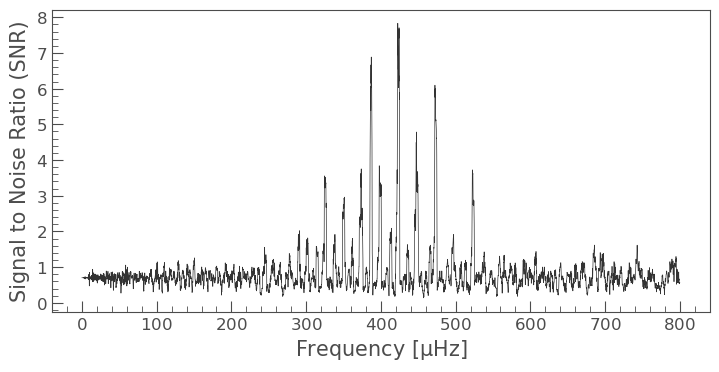

In [18]:
pg = pg[pg.frequency < 800*u.uHz].flatten()
pg.plot()

pg_mt = pg_mt[pg_mt.frequency < 800*u.uHz].flatten()
pg_mt.plot()

## Peak-bagging with LS

Starting KDE estimation


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/priors.py:149: UserWarning: Only 0 star(s) near provided numax. Trying to expand the range to include ~100 stars.
  warnings.warn(f'Only {len(pdata[idx])} star(s) near provided numax. ' +
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/priors.py:164: UserWarning: Sample for estimating KDE is less than the requested 100.
  warnings.warn(f'Sample for estimating KDE is less than the requested {KDEsize}.')


Steps taken: 2000
Chains reached stationary state after 2000 iterations.


No handles with labels found to put in legend.
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/asy_peakbag.py:383: UserWarning: Method mcmc not found: Using method mcmc
  warnings.warn(f'Method {method} not found: Using method mcmc')


Starting asymptotic peakbagging
Steps taken: 2000
Steps taken: 3000
Steps taken: 4000
Chains reached stationary state after 4000 iterations.


Starting peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pymc3/sampling.py:465: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...
Sequential sampling (2 chains in 1 job)
INFO:pymc3:Sequential sampling (2 chains in 1 job)
NUTS: [back, height2, height0, l2, l0, width2, width0]
INFO:pymc3:NUTS: [back, height2, height0, l2, l0, width2, width0]
Sampling 2 chains for 1_500 tune and 1_000 draw iterations (3_000 + 2_000 draws total) took 66 seconds.
INFO:pymc3:Sampling 2 chains for 1_500 tune and 1_000 draw iterations (3_000 + 2_000 draws total) took 66 seconds.
The rhat statistic is larger than 1.4 for some parameters. The sampler d

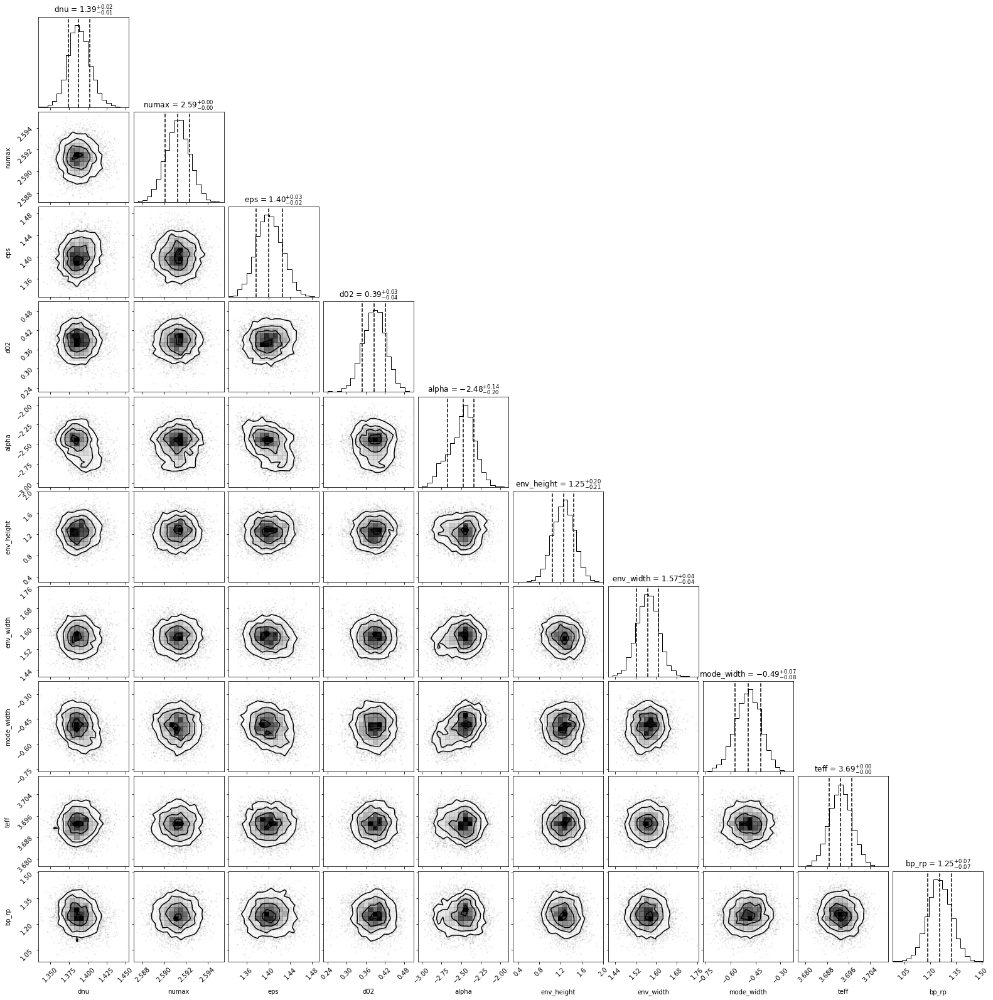

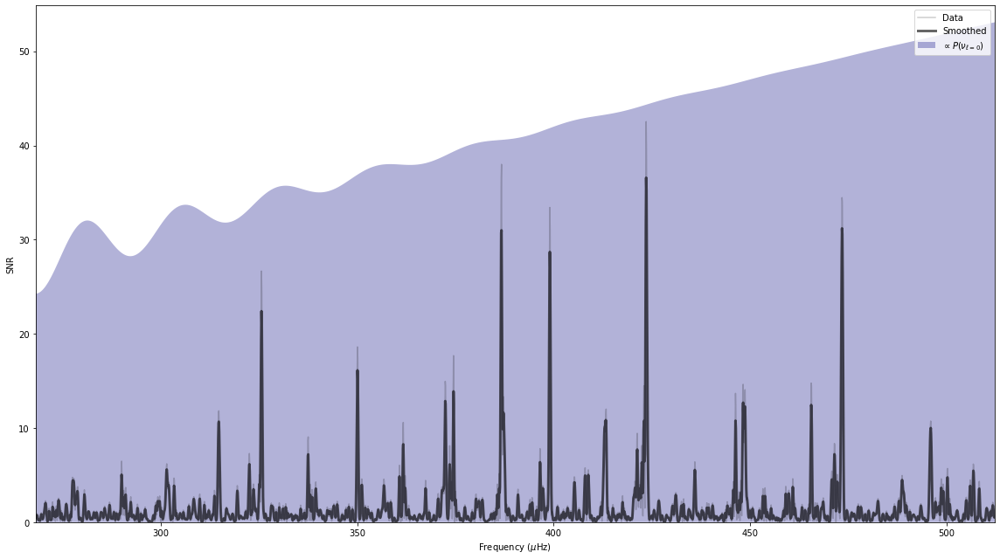

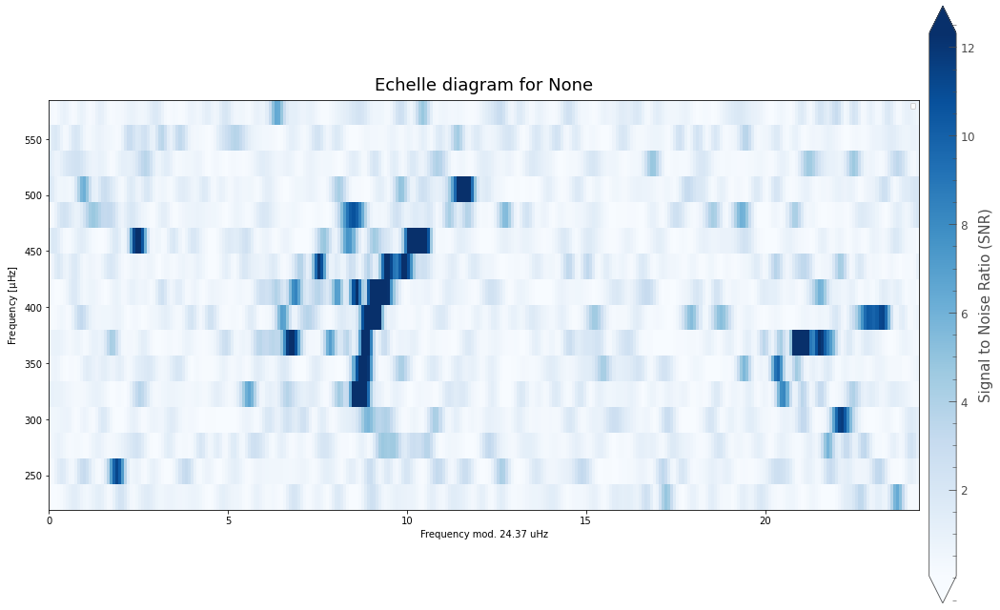

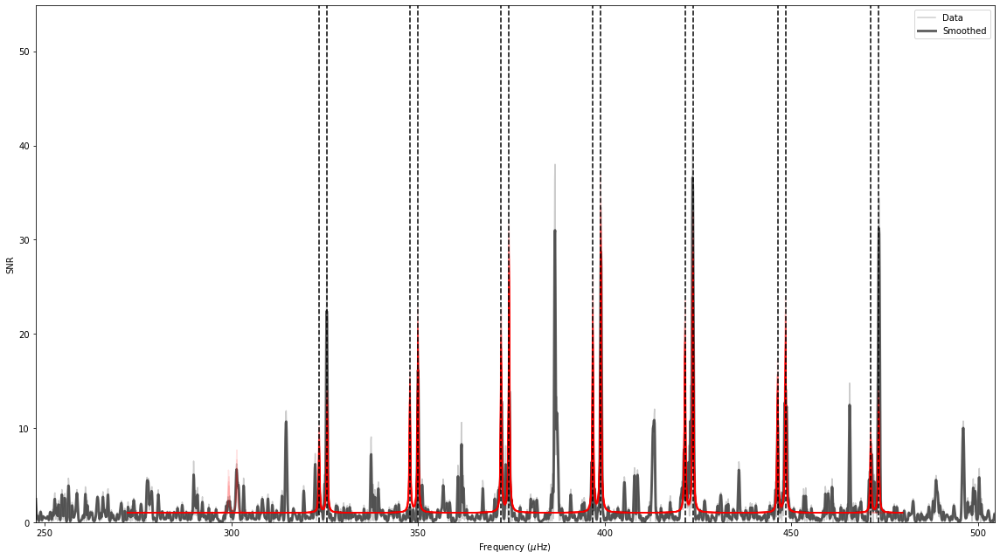

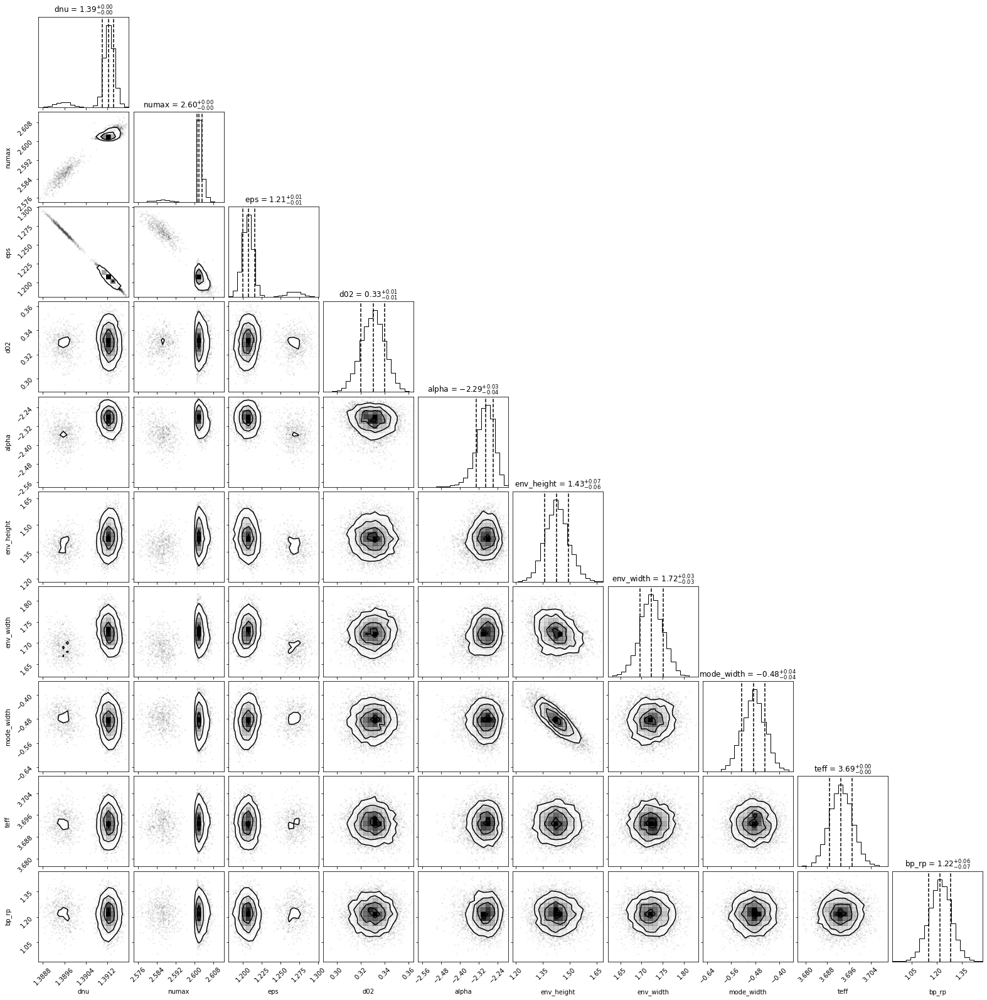

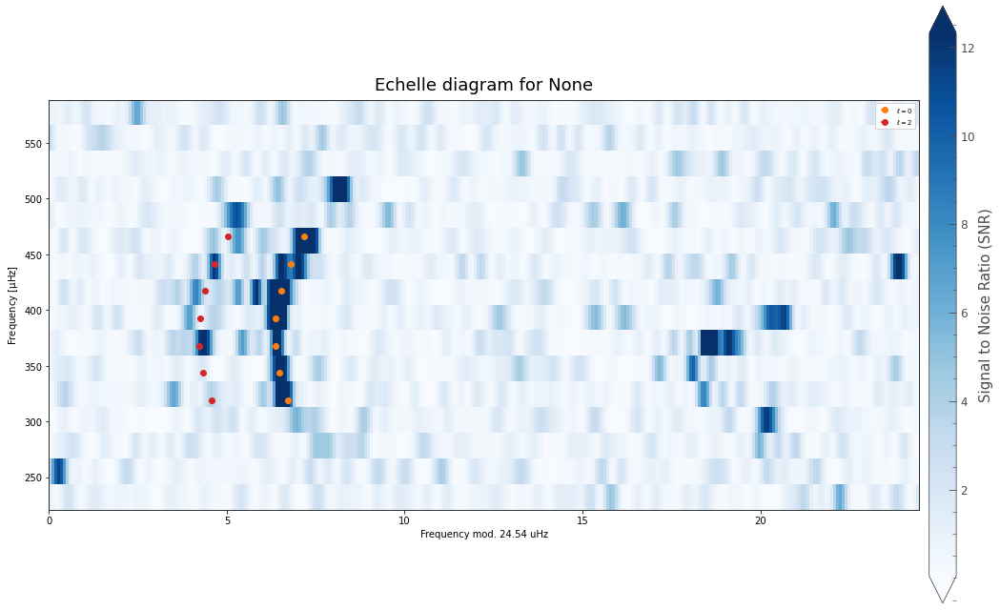

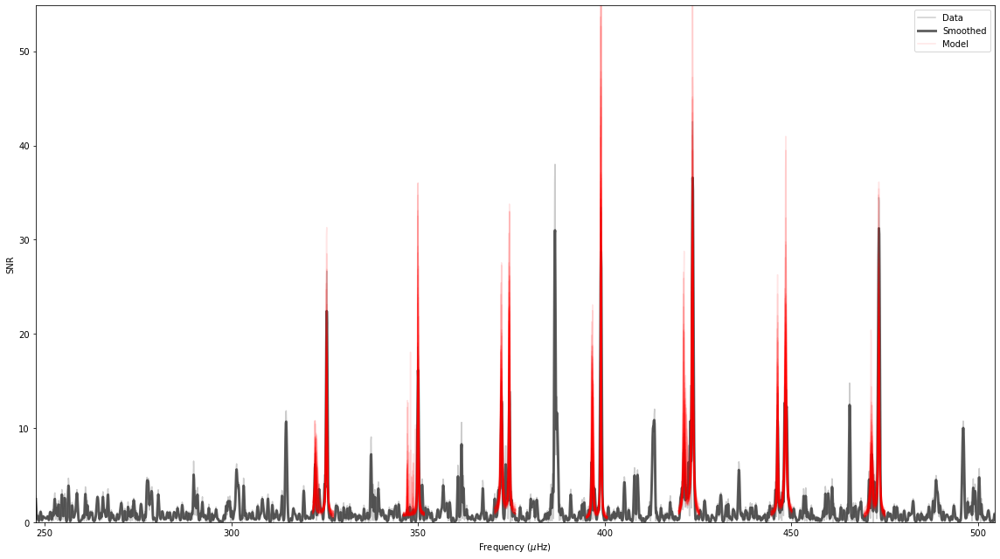

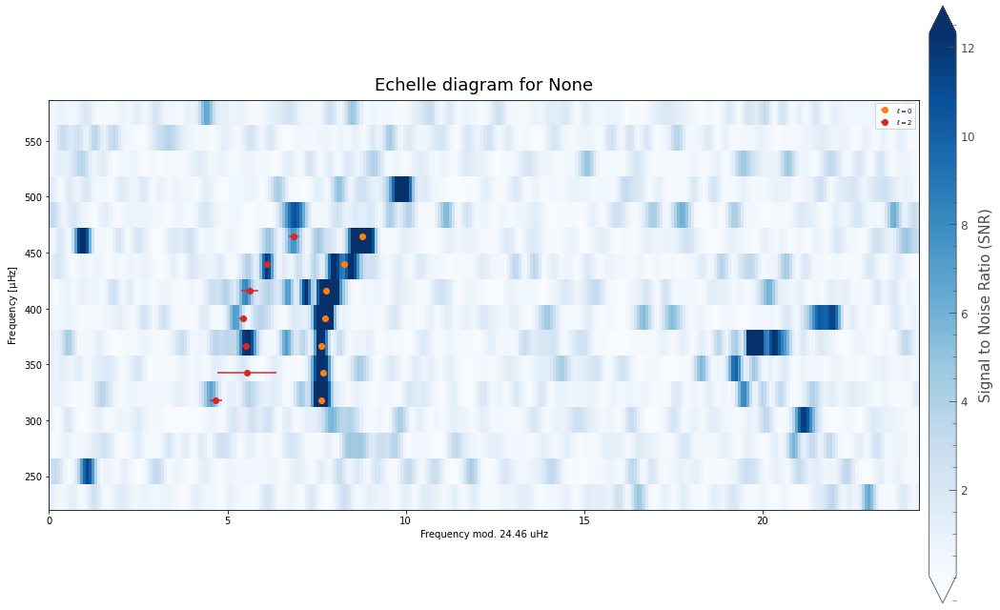

In [138]:
ID = 's4tess_sec_1_1'
numax = (star_info['NU_MAX'], 1.0)
dnu = (star_info['DELTA_NU'], 2)
teff = (star_info['TEFF'], 50)
bp_rp = (1.34, 0.1)

st = pb.star(ID, pg, numax, dnu, teff, bp_rp)
st(norders = 7, make_plots=True)

## Peak-bagging with multitaper LS

Starting KDE estimation


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/priors.py:149: UserWarning: Only 0 star(s) near provided numax. Trying to expand the range to include ~100 stars.
  warnings.warn(f'Only {len(pdata[idx])} star(s) near provided numax. ' +
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/priors.py:164: UserWarning: Sample for estimating KDE is less than the requested 100.
  warnings.warn(f'Sample for estimating KDE is less than the requested {KDEsize}.')


Steps taken: 2000
Chains reached stationary state after 2000 iterations.


No handles with labels found to put in legend.
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/asy_peakbag.py:383: UserWarning: Method mcmc not found: Using method mcmc
  warnings.warn(f'Method {method} not found: Using method mcmc')


Starting asymptotic peakbagging
Steps taken: 2000
Chains reached stationary state after 2000 iterations.
Starting peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pymc3/sampling.py:465: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [back, height2, height0, l2, l0, width2, width0]
Sampling 2 chains for 1_500 tune and 1_000 draw iterations (3_000 + 2_000 draws total) took 34 seconds.
The number of effective samples is smaller than 25% for some parameters.
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:88: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model c

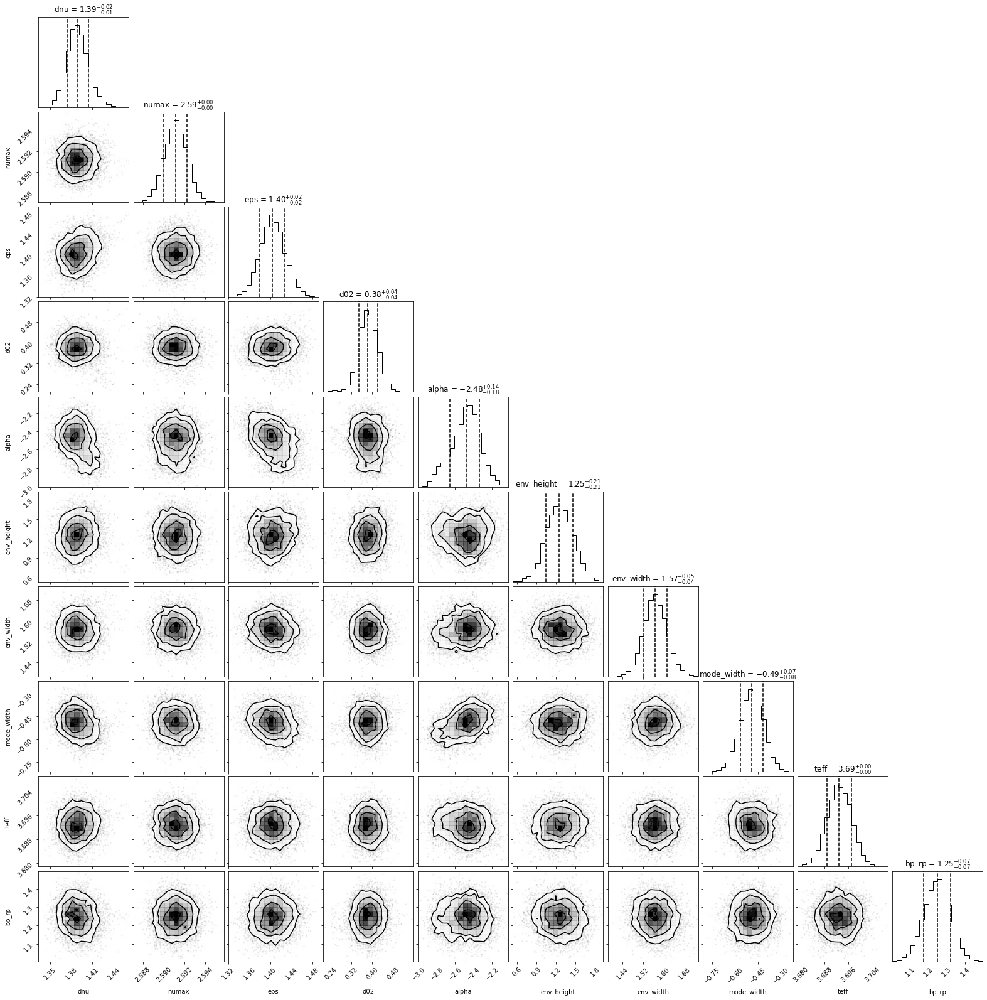

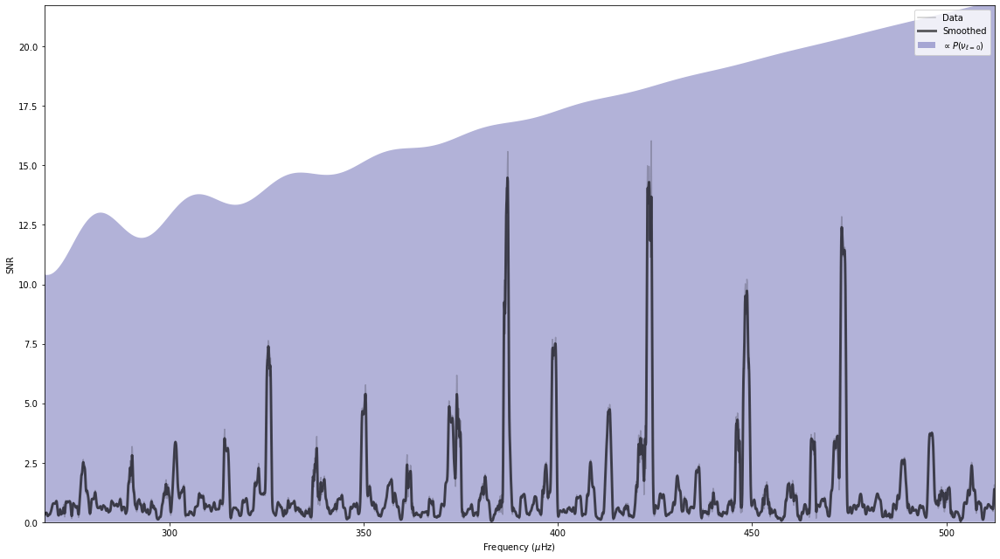

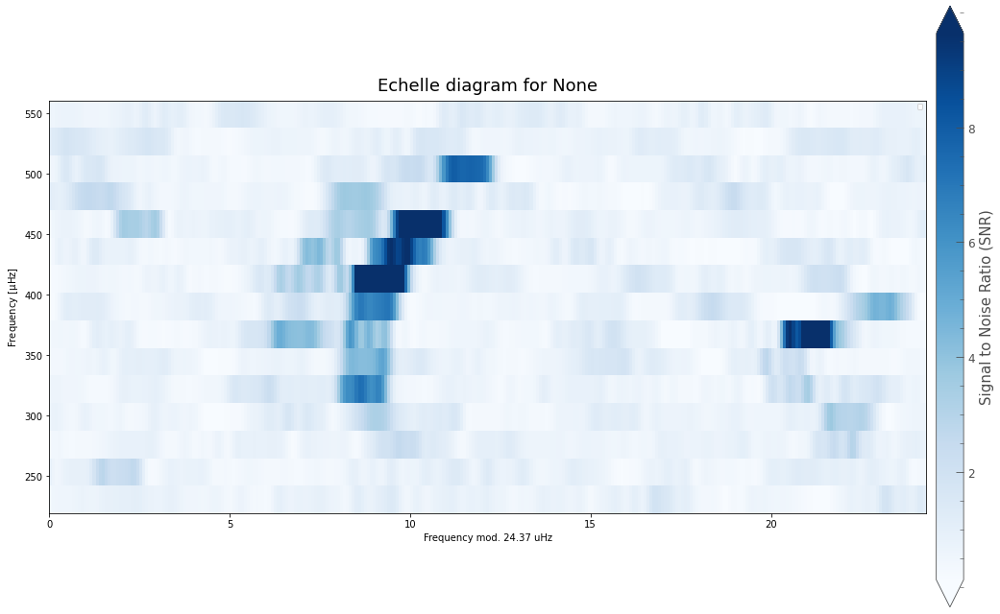

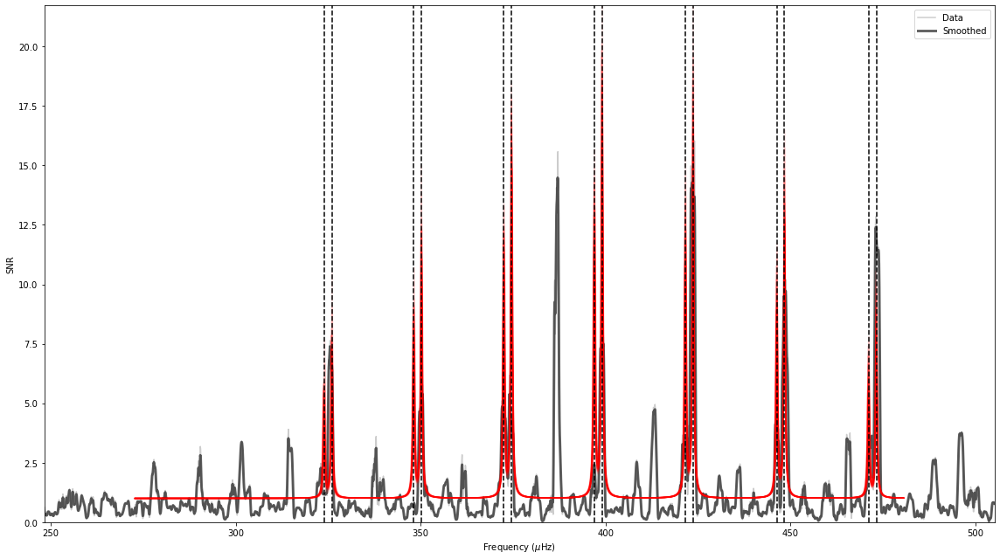

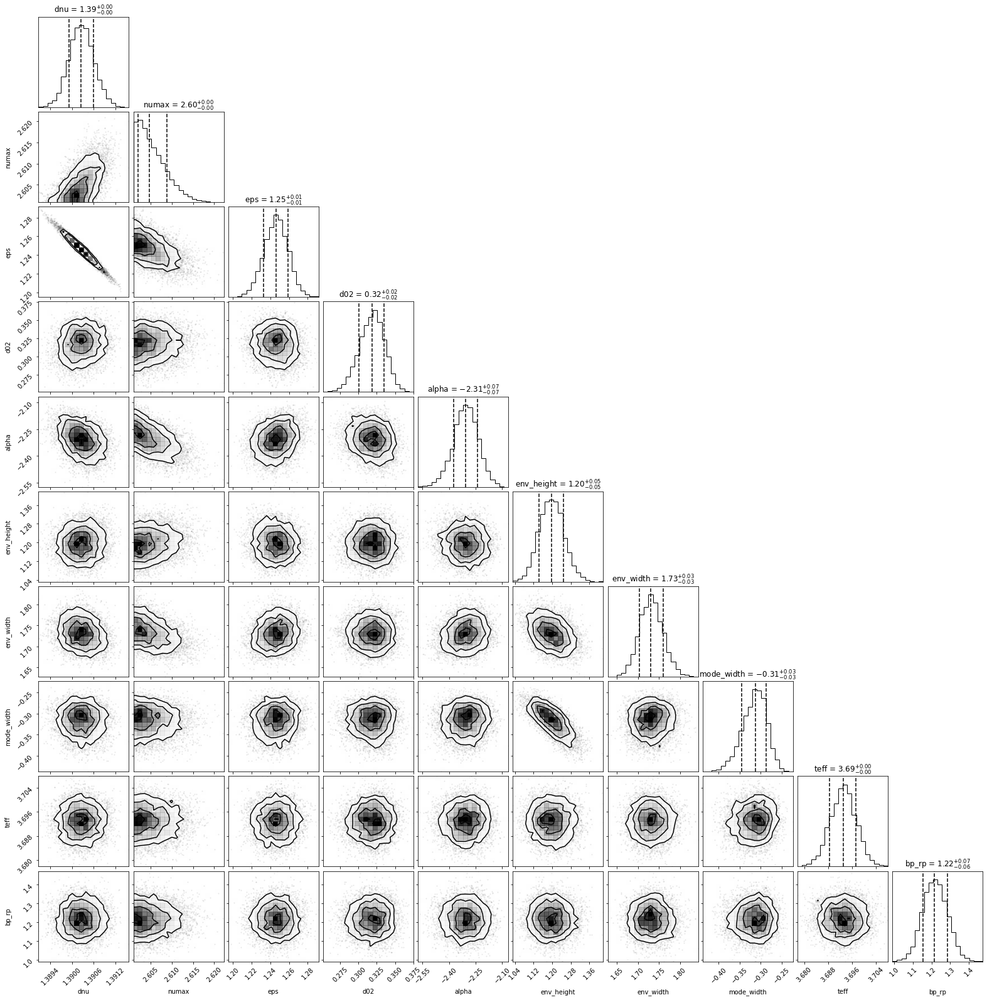

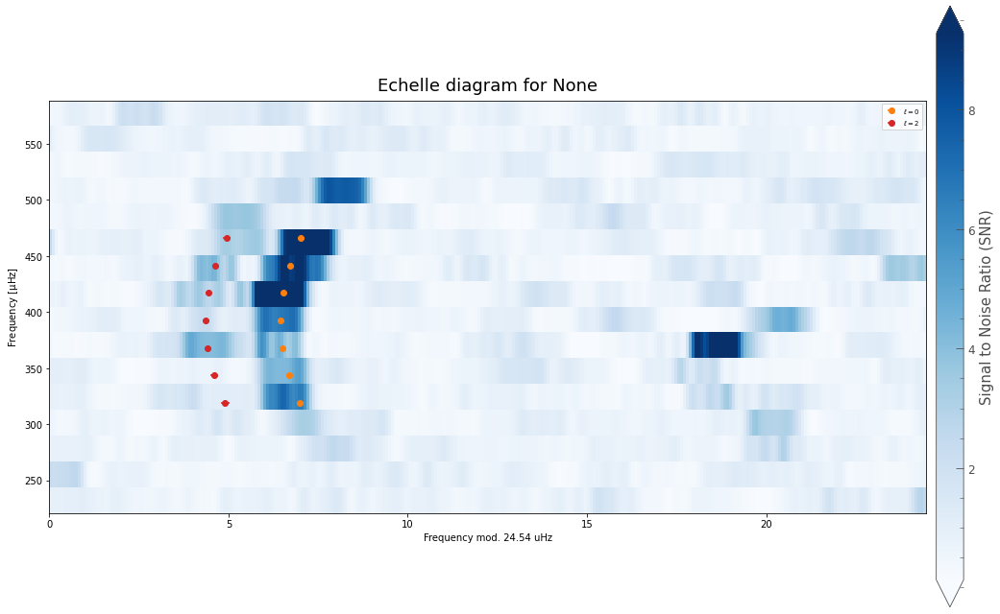

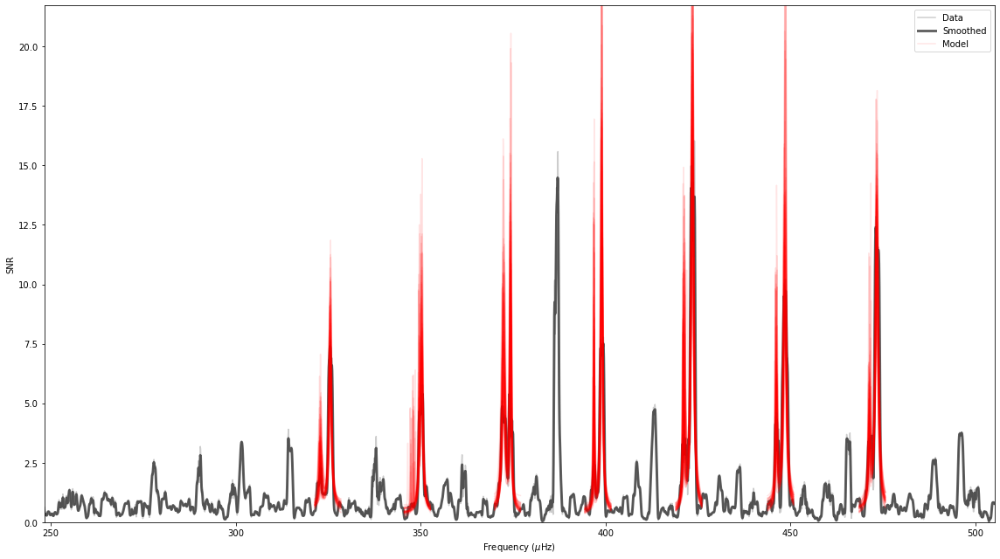

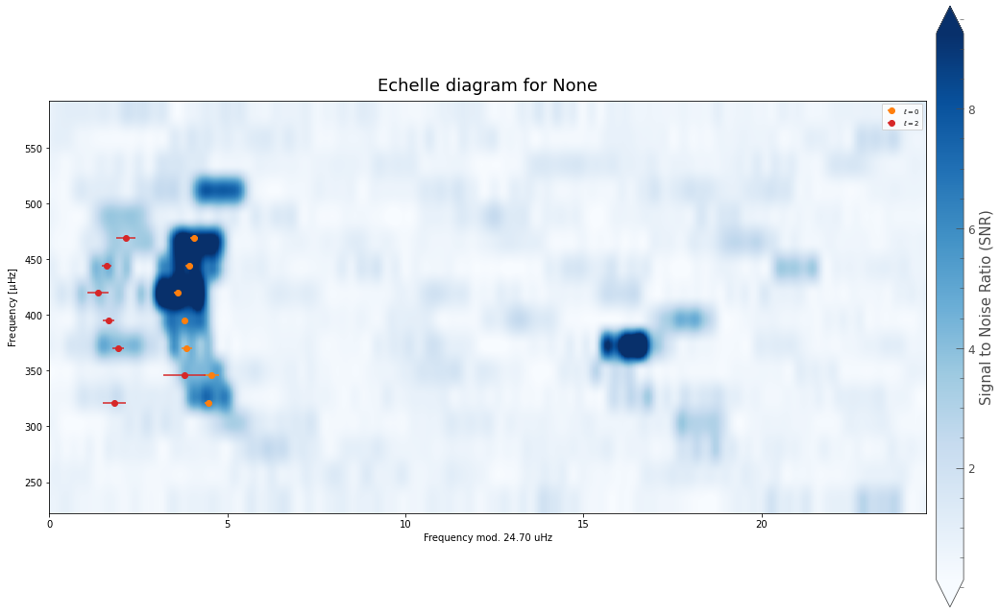

In [137]:
ID = 's4tess_sec_1_1'
numax = (star_info['NU_MAX'], 1.0)
dnu = (star_info['DELTA_NU'], 2)
teff = (star_info['TEFF'], 50)
bp_rp = (1.34, 0.1)

st = pb.star(ID, pg_mt, numax, dnu, teff, bp_rp)
st(norders = 7, make_plots=True)


# KIC7949599

In [5]:
lcs = lk.search_lightcurvefile('KIC7949599').download_all()
lc = lcs.PDCSAP_FLUX.stitch().normalize().flatten(window_length=401).remove_outliers(4)

/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/lightkurve/lightcurve.py:698: LightkurveWarning: The light curve already appears to be in relative units; `normalize()` will convert the light curve into relative units for a second time, which is probably not what you want.
  warnings.warn("The light curve already appears to be in relative "


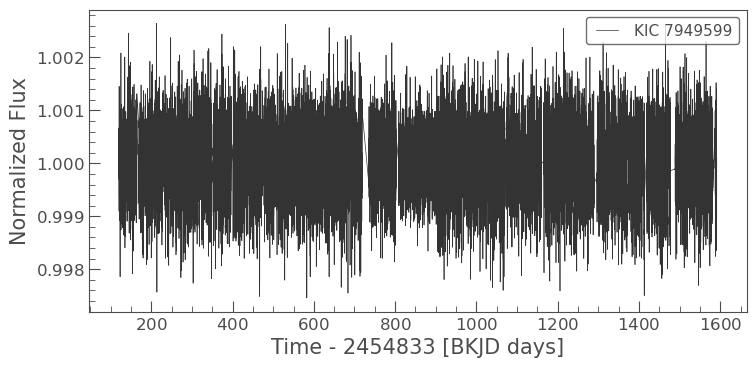

In [6]:
lc.plot()

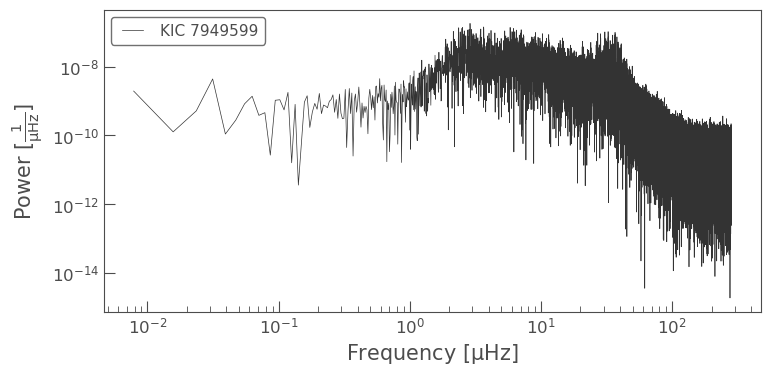

In [7]:
pg = lc.to_periodogram(normalization='psd')
pg.plot(scale='log')

In [8]:
freq, power = LombScargle(lc.time*u.day, lc.flux).autopower(method='fast', nyquist_factor=1)
freqMT, powerMT = mtls_spec(lc.time*u.day, lc.flux, center_data=True,
                            NW=4, K=7, nyquist_factor=1)

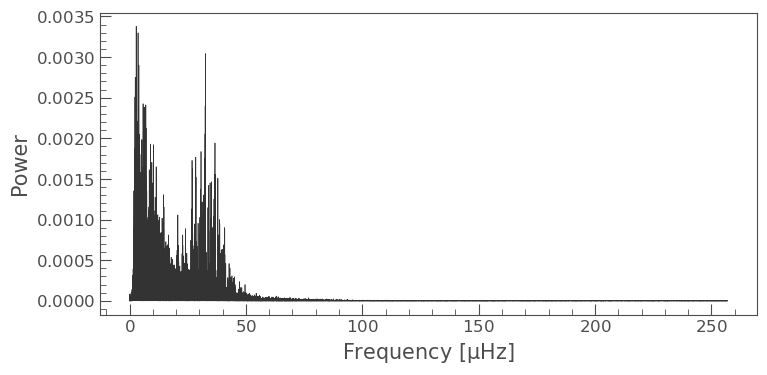

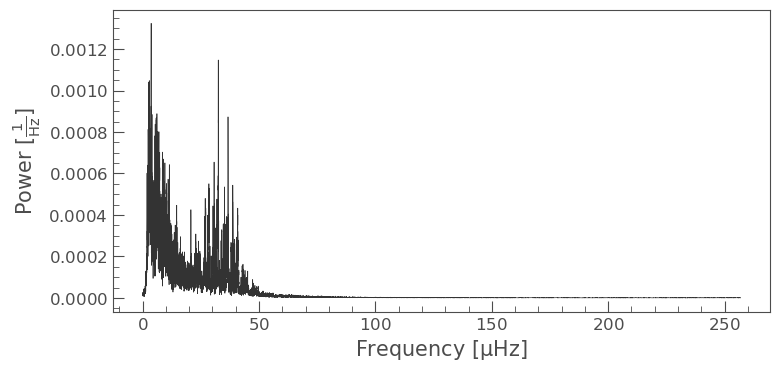

In [9]:
pg = lk.periodogram.Periodogram(frequency=freq.to(u.uHz), power=power)
pg.plot()

pg_mt = lk.periodogram.Periodogram(frequency=freqMT.to(u.uHz), power=powerMT)
pg_mt.plot()

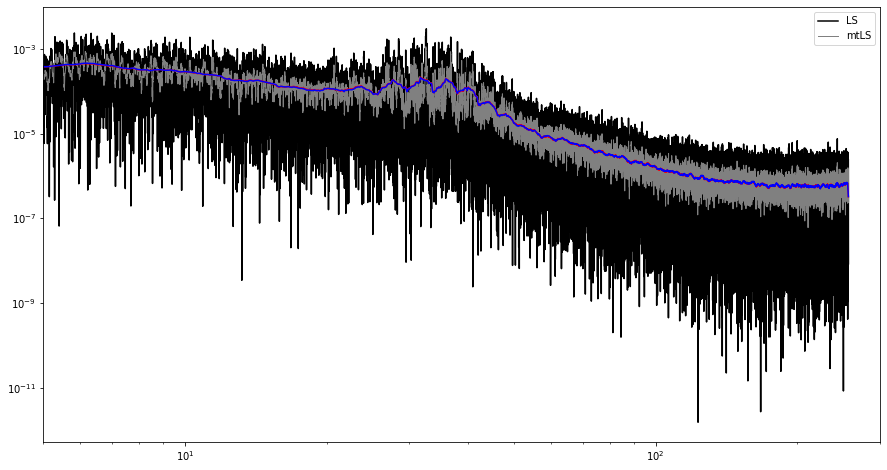

In [12]:
pg_smooth = pg.smooth(method='boxkernel', filter_width=2)
pg_mt_smooth = pg_mt.smooth(method='boxkernel', filter_width=2)

plt.figure(figsize=(15, 8))
plt.plot(pg.frequency, pg.power, color='black', label='LS')
plt.plot(pg_mt.frequency, pg_mt.power, color='grey', label='mtLS', linewidth=1)
plt.plot(pg_smooth.frequency, pg_smooth.power, color='red')
plt.plot(pg_mt_smooth.frequency, pg_mt_smooth.power, color='blue')
plt.xscale('log')
plt.yscale('log')
plt.xlim(5, 3*10**2)
plt.legend()

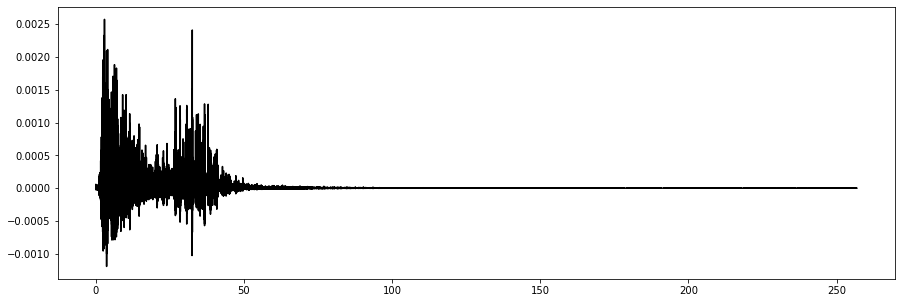

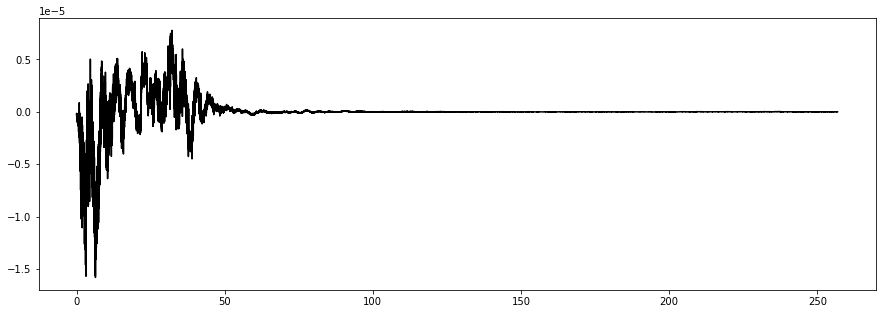

In [14]:
plt.figure(figsize=(15, 5))
plt.plot(pg.frequency, pg.power.value - pg_mt.power.value, color='black')

plt.figure(figsize=(15, 5))
plt.plot(pg_smooth.frequency, pg_smooth.power.value - pg_mt_smooth.power.value, color='black')

# KIC4448777

In [103]:
lcs = lk.search_lightcurvefile('KIC4448777').download_all()
lc = lcs.PDCSAP_FLUX.stitch().normalize().flatten(window_length=401).remove_outliers(4)

/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/lightkurve/lightcurve.py:698: LightkurveWarning: The light curve already appears to be in relative units; `normalize()` will convert the light curve into relative units for a second time, which is probably not what you want.
  warnings.warn("The light curve already appears to be in relative "


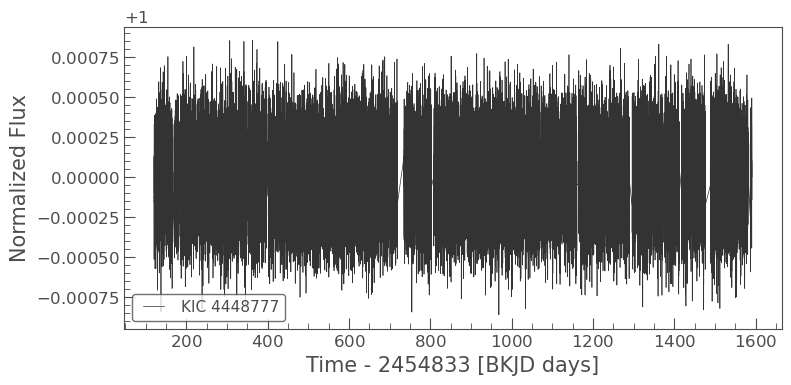

In [104]:
lc.plot()

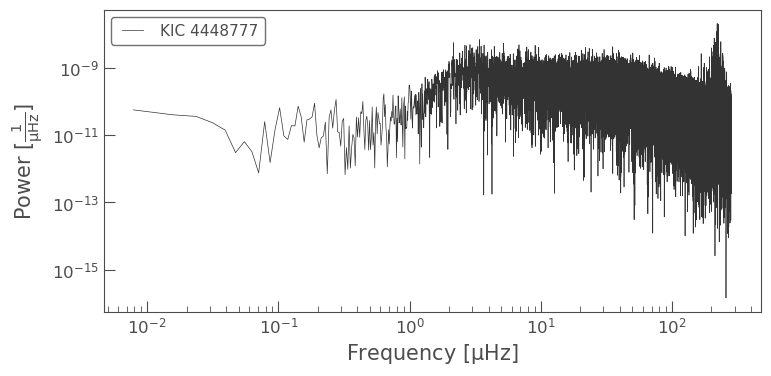

In [105]:
pg = lc.to_periodogram(normalization='psd')
pg.plot(scale='log')

In [112]:
freq, power = LombScargle(lc.time*u.day, lc.flux).autopower(method='fast', nyquist_factor=1)
freqMT, powerMT = LSspecMT(lc.time*u.day, lc.flux, center_data=True,
                          NW=2.5, K=4, nyquist_factor=1)

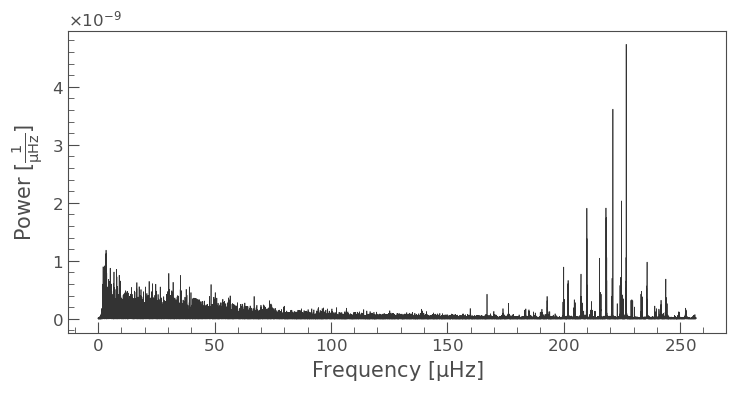

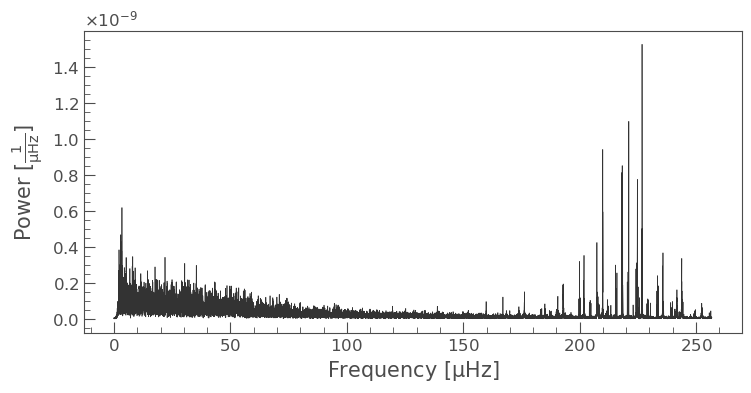

In [113]:
freq_Q = freq.to(u.uHz)
power_Q = u.Quantity(power.value*10**(-6), unit=1/u.microhertz)

freqMT_Q = freqMT.to(u.uHz)
powerMT_Q = u.Quantity(powerMT*10**(-6), unit=1/u.microhertz)

pg = lk.periodogram.Periodogram(frequency=freq_Q, power=power_Q)
pg.plot()

pg_mt = lk.periodogram.Periodogram(frequency=freqMT_Q, power=powerMT_Q)
pg_mt.plot()

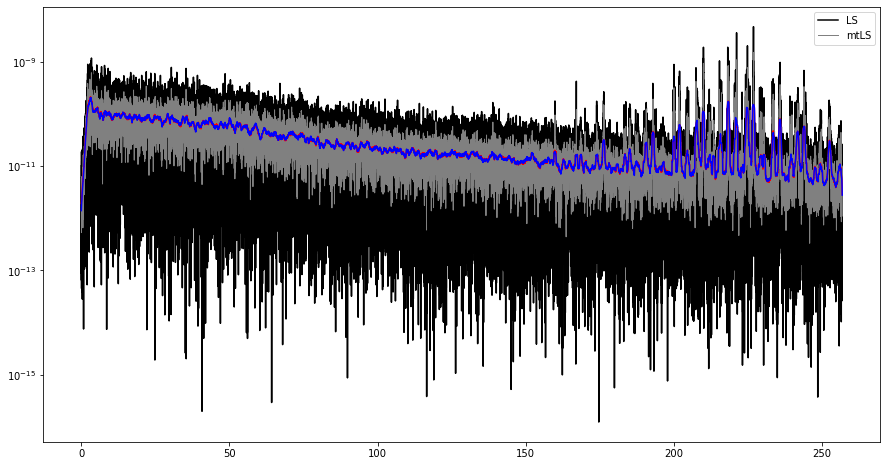

In [170]:
pg_smooth = pg.smooth(method='boxkernel', filter_width=0.75)
pg_mt_smooth = pg_mt.smooth(method='boxkernel', filter_width=0.75)

plt.figure(figsize=(15, 8))
plt.plot(pg.frequency, pg.power, color='black', label='LS')
plt.plot(pg_mt.frequency, pg_mt.power, color='grey', label='mtLS', linewidth=1)
plt.plot(pg_smooth.frequency, pg_smooth.power, color='red')
plt.plot(pg_mt_smooth.frequency, pg_mt_smooth.power, color='blue')
plt.yscale('log')
plt.legend()

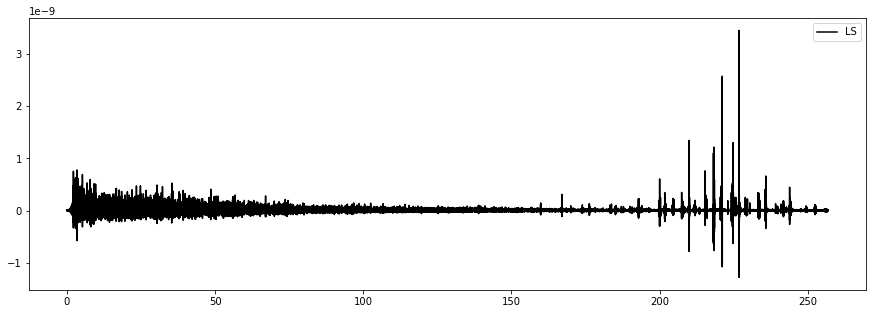

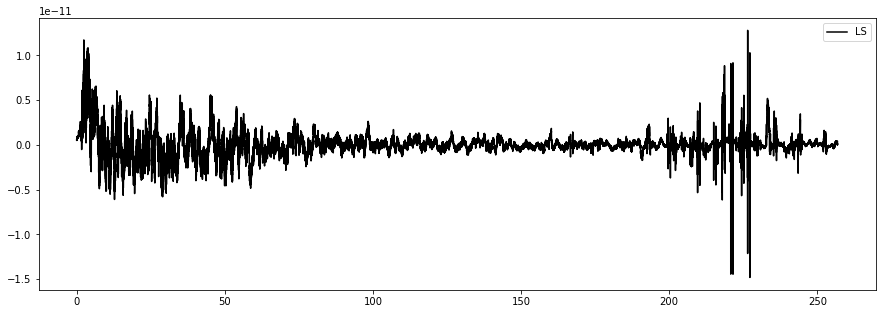

In [191]:
plt.figure(figsize=(15, 5))
plt.plot(pg_smooth.frequency, pg.power - pg_mt.power, color='black', label='LS')
plt.legend()

plt.figure(figsize=(15, 5))
plt.plot(pg_smooth.frequency, pg_smooth.power - pg_mt_smooth.power, color='black', label='LS')
plt.legend()

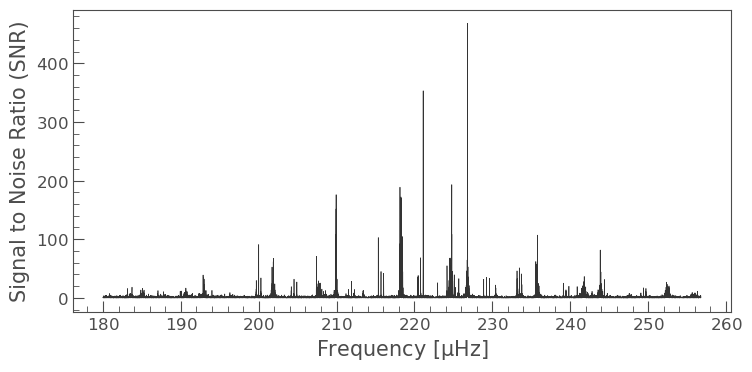

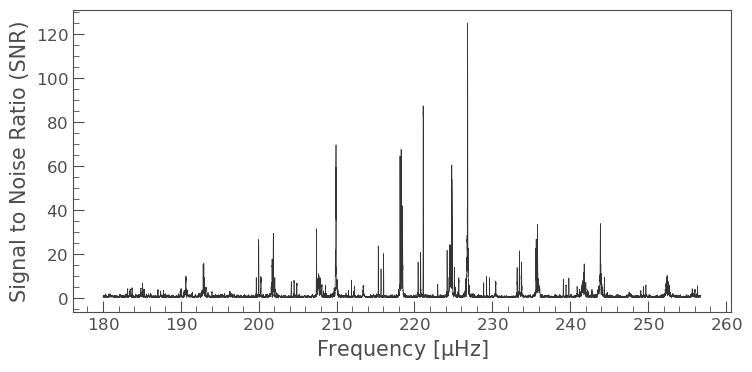

In [88]:
pg = pg[pg.frequency > 180*(u.uHz)]
pg_SNR = pg.flatten()
pg_SNR.plot()

pg_mt = pg_mt[pg_mt.frequency > 180*(u.uHz)]
pg_mt_SNR = pg_mt.flatten()
pg_mt_SNR.plot()

In [56]:
ID = 'KIC4448777'
numax = (220.0, 3.0)
dnu = (16.97, 0.05)
teff = (4750, 100)
bp_rp = (1.34, 0.1)

Starting KDE estimation


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/priors.py:149: UserWarning: Only 61 star(s) near provided numax. Trying to expand the range to include ~100 stars.
  warnings.warn(f'Only {len(pdata[idx])} star(s) near provided numax. ' +


Steps taken: 2000
Steps taken: 3000
Steps taken: 4000
Steps taken: 5000
Steps taken: 6000
Steps taken: 7000
Chains reached stationary state after 7000 iterations.


No handles with labels found to put in legend.


Starting asymptotic peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/asy_peakbag.py:383: UserWarning: Method mcmc not found: Using method mcmc
  warnings.warn(f'Method {method} not found: Using method mcmc')


Steps taken: 2000
Chains reached stationary state after 2000 iterations.
Starting peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pymc3/sampling.py:465: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [back, height2, height0, l2, l0, width2, width0]
Sampling 2 chains for 1_500 tune and 1_000 draw iterations (3_000 + 2_000 draws total) took 128 seconds.
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:88: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(
/Users/aaryapatil/opt/anaconda3/lib/python3.8/s

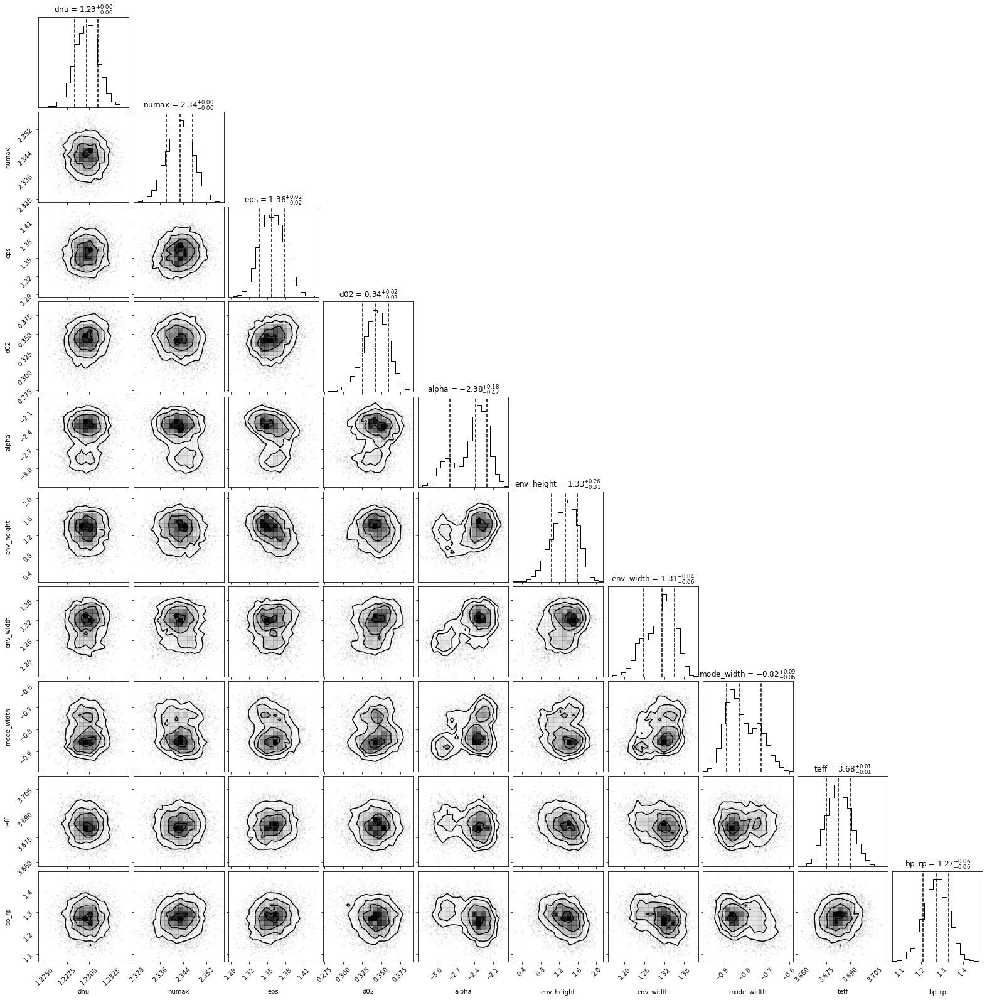

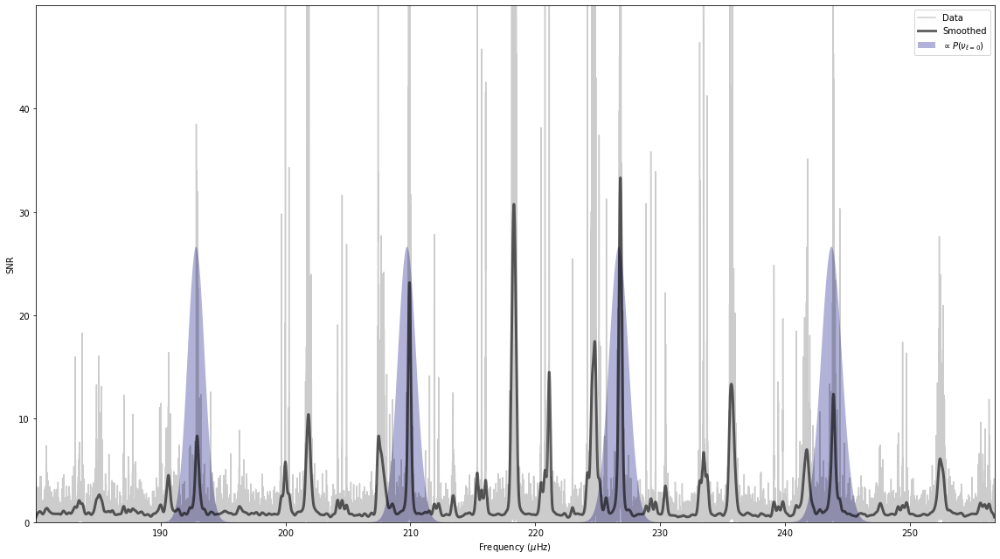

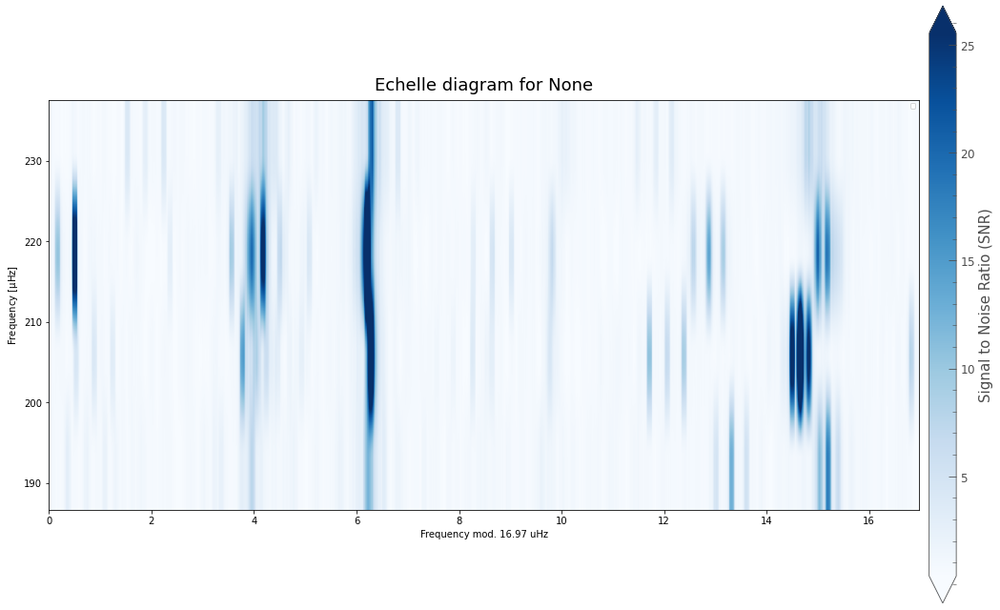

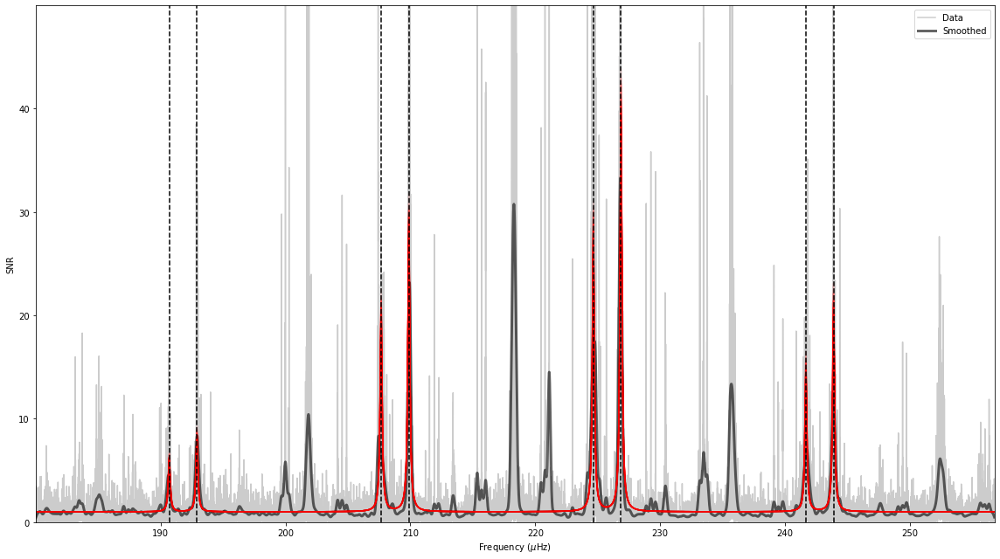

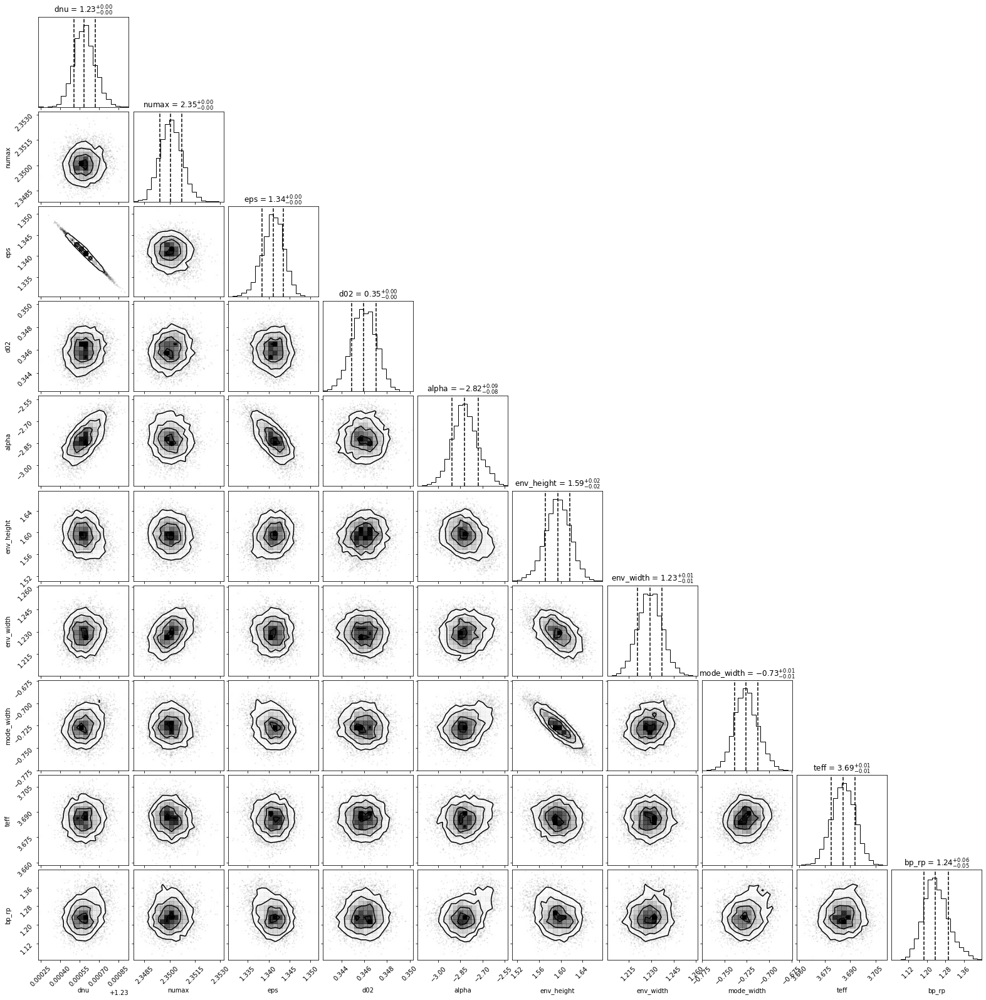

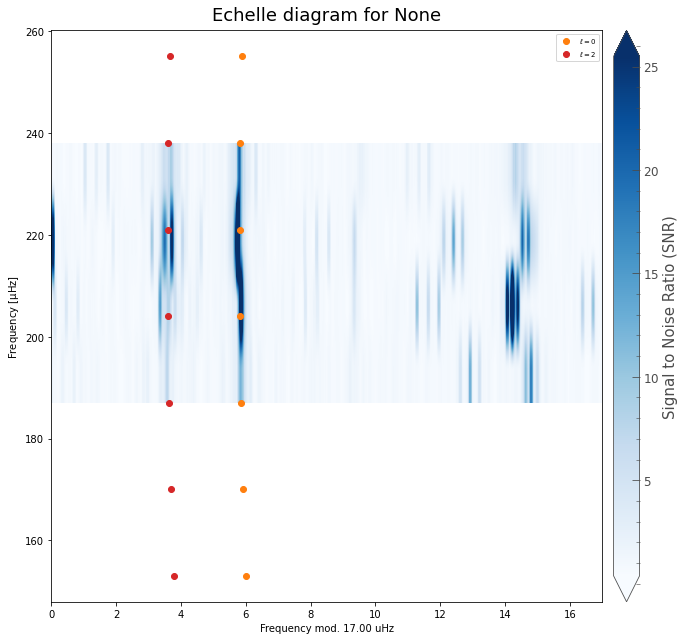

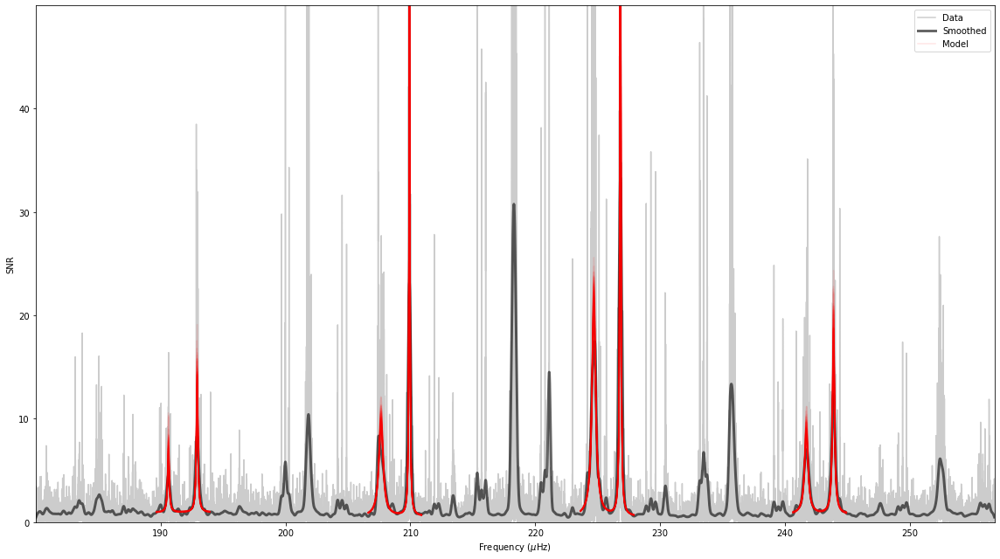

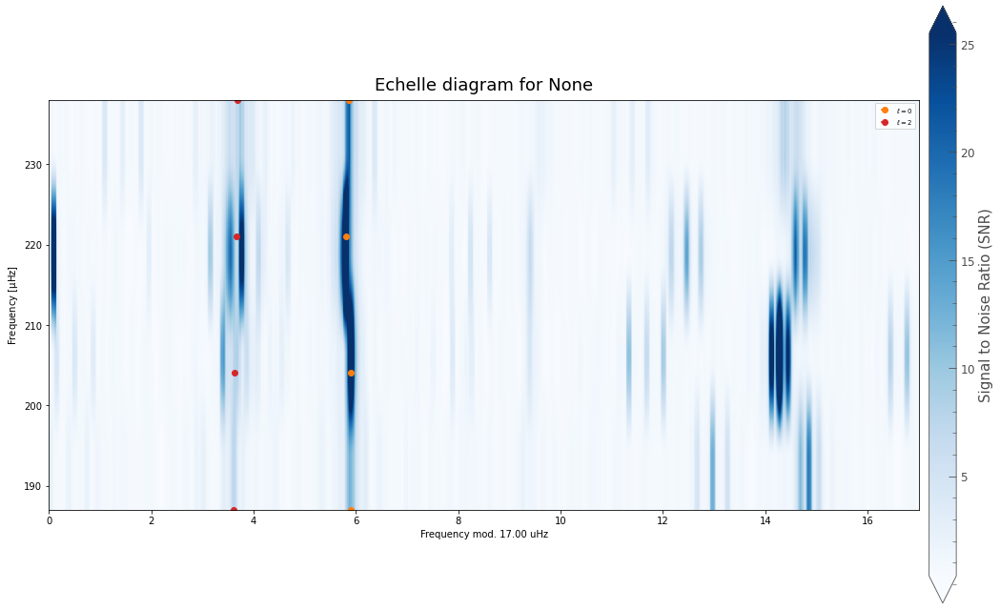

In [89]:
st = pb.star(ID, pg_SNR, numax, dnu, teff, bp_rp)
st(norders = 7, make_plots=True)

Starting KDE estimation


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/priors.py:149: UserWarning: Only 61 star(s) near provided numax. Trying to expand the range to include ~100 stars.
  warnings.warn(f'Only {len(pdata[idx])} star(s) near provided numax. ' +


Steps taken: 2000
Steps taken: 3000
Steps taken: 4000
Steps taken: 5000
Steps taken: 6000
Chains reached stationary state after 6000 iterations.


No handles with labels found to put in legend.


Starting asymptotic peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pbjam/asy_peakbag.py:383: UserWarning: Method mcmc not found: Using method mcmc
  warnings.warn(f'Method {method} not found: Using method mcmc')


Steps taken: 2000
Chains reached stationary state after 2000 iterations.
Starting peakbagging


/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/pymc3/sampling.py:465: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [back, height2, height0, l2, l0, width2, width0]
Sampling 2 chains for 1_500 tune and 1_000 draw iterations (3_000 + 2_000 draws total) took 104 seconds.
/Users/aaryapatil/opt/anaconda3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:88: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(
/Users/aaryapatil/opt/anaconda3/lib/python3.8/s

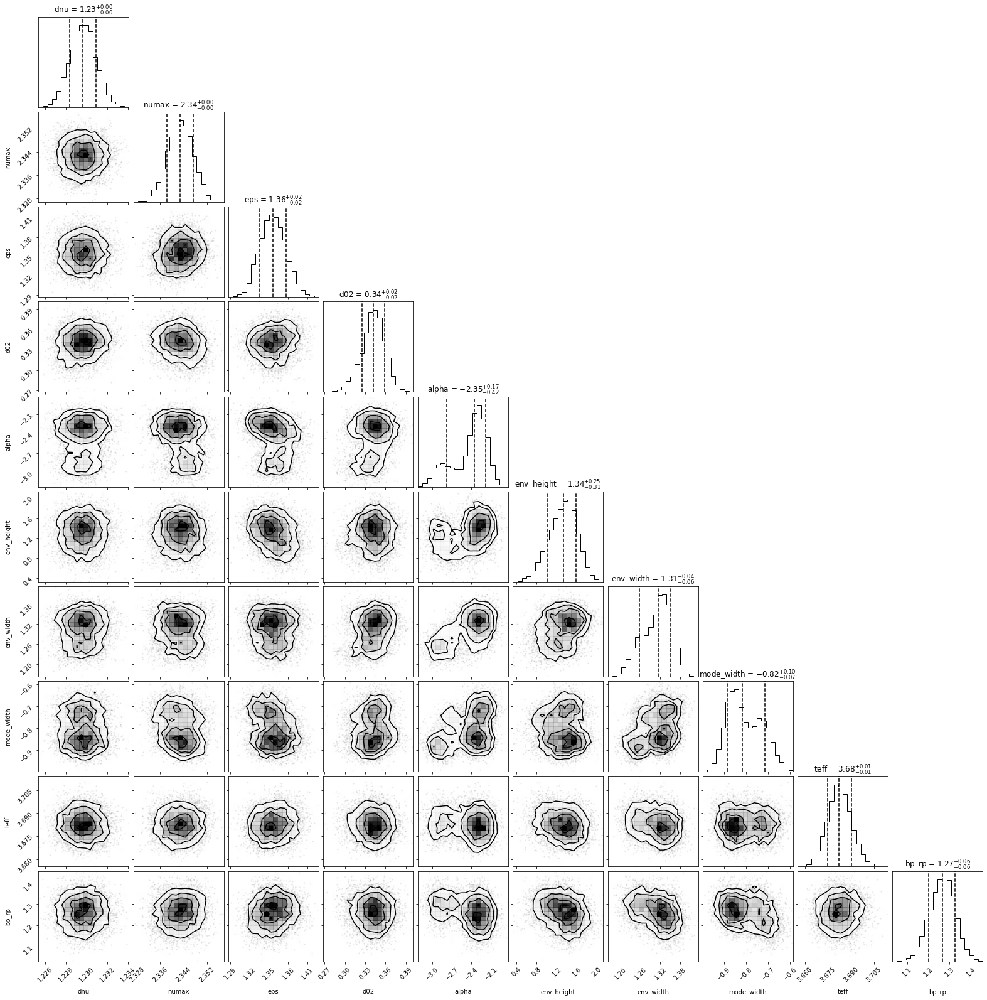

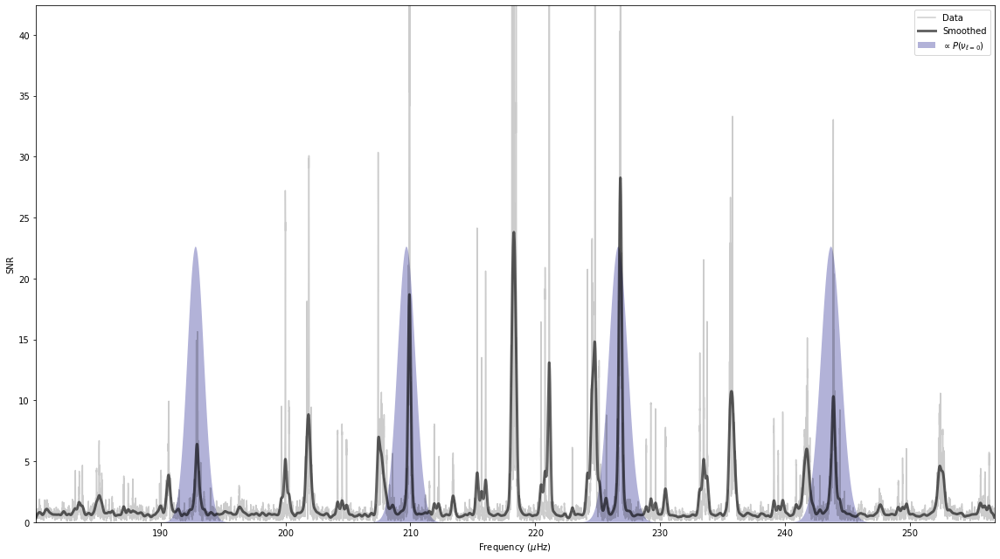

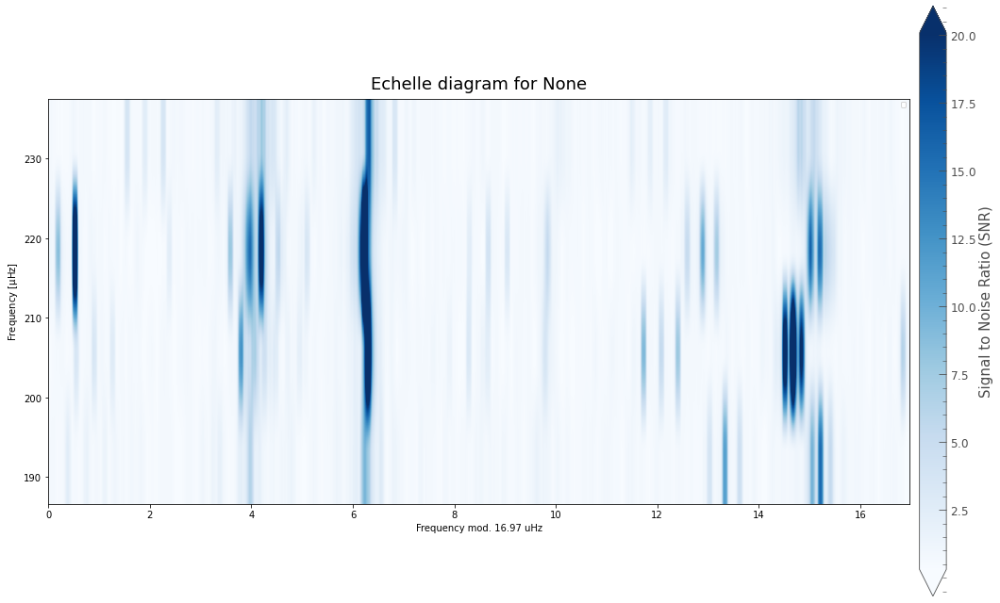

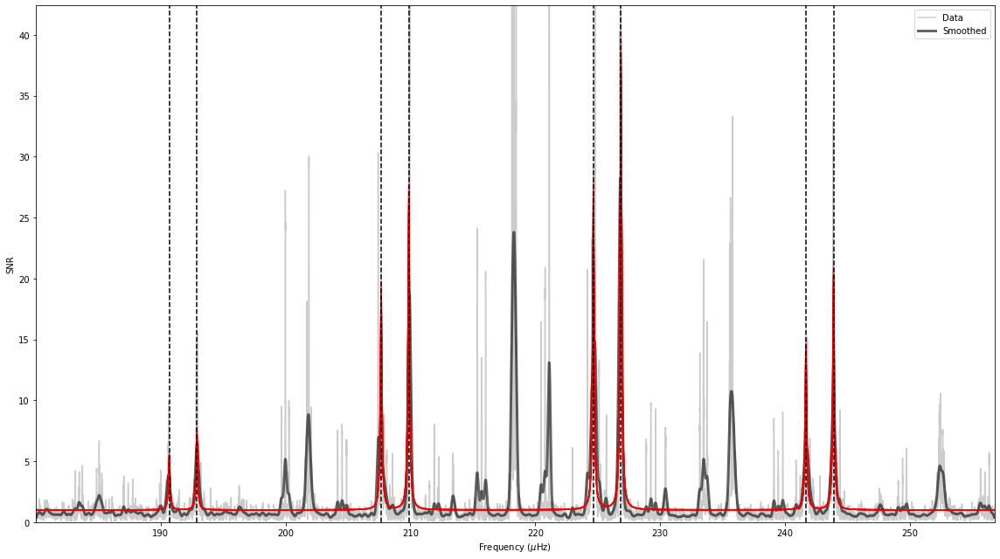

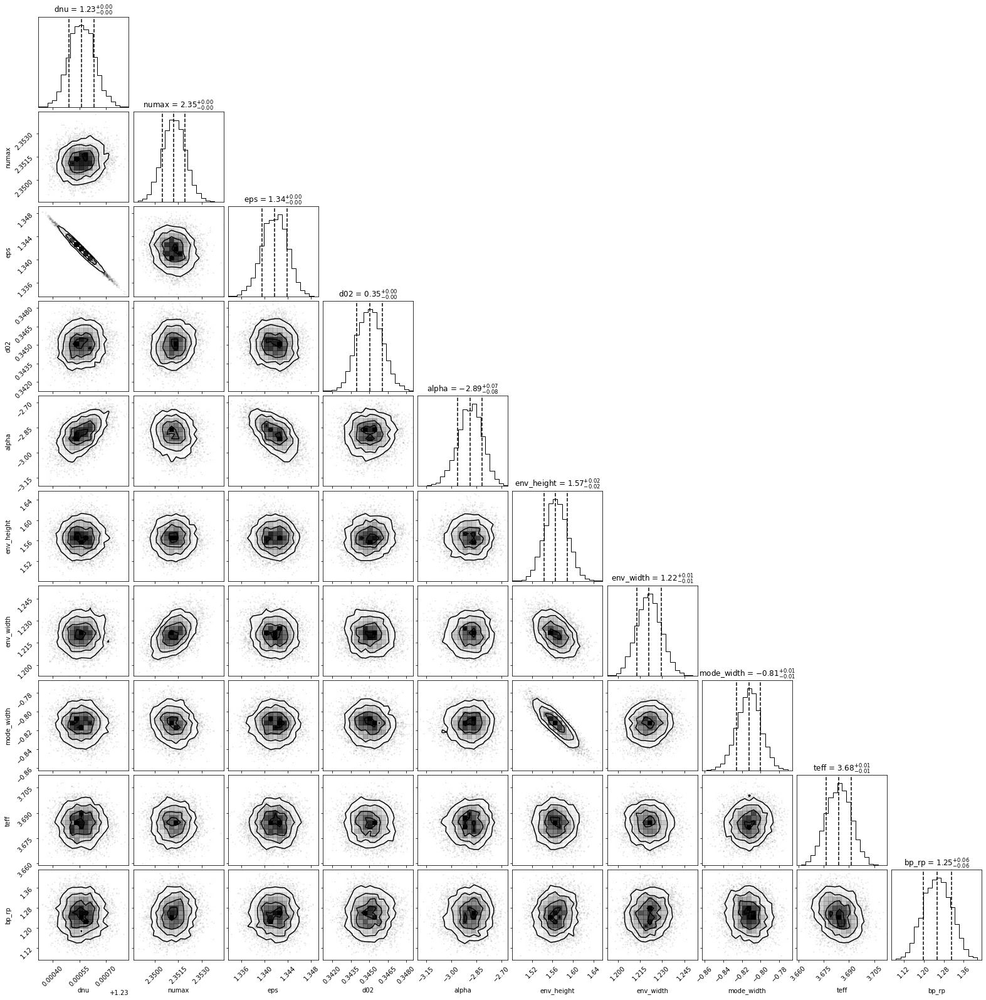

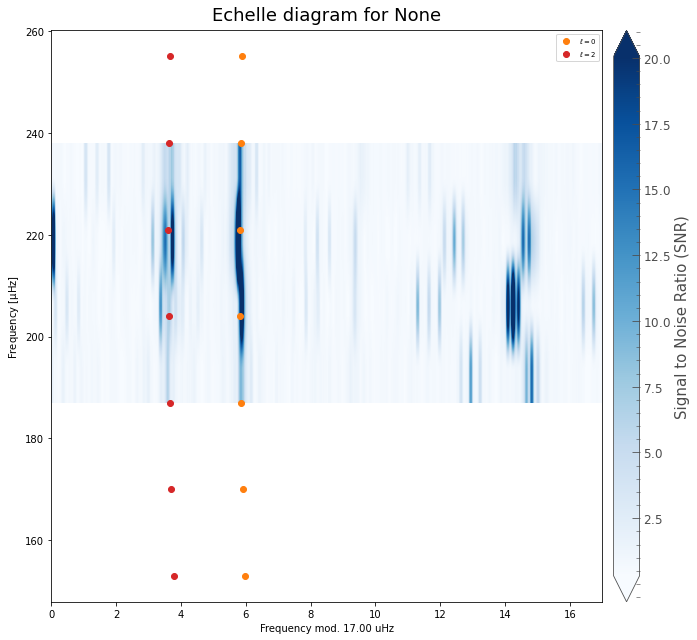

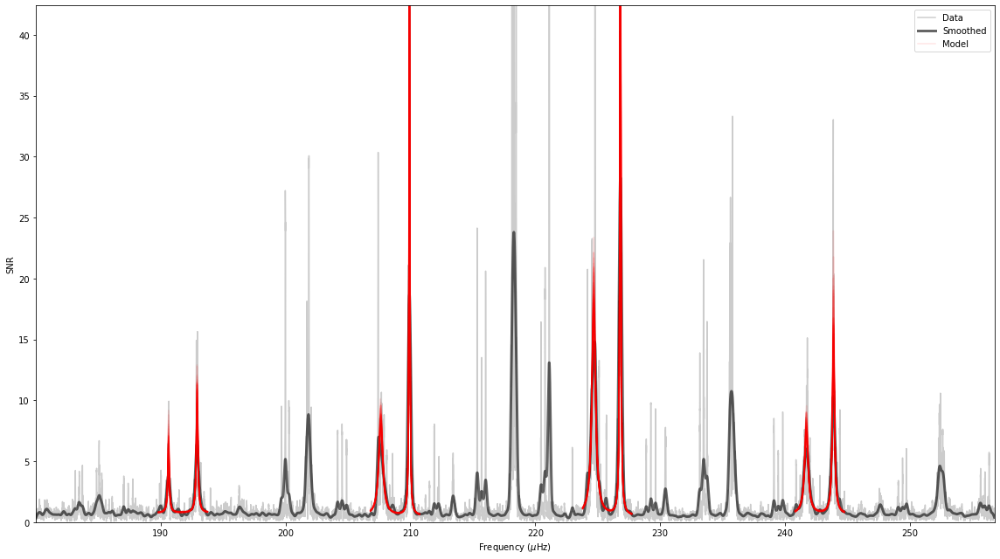

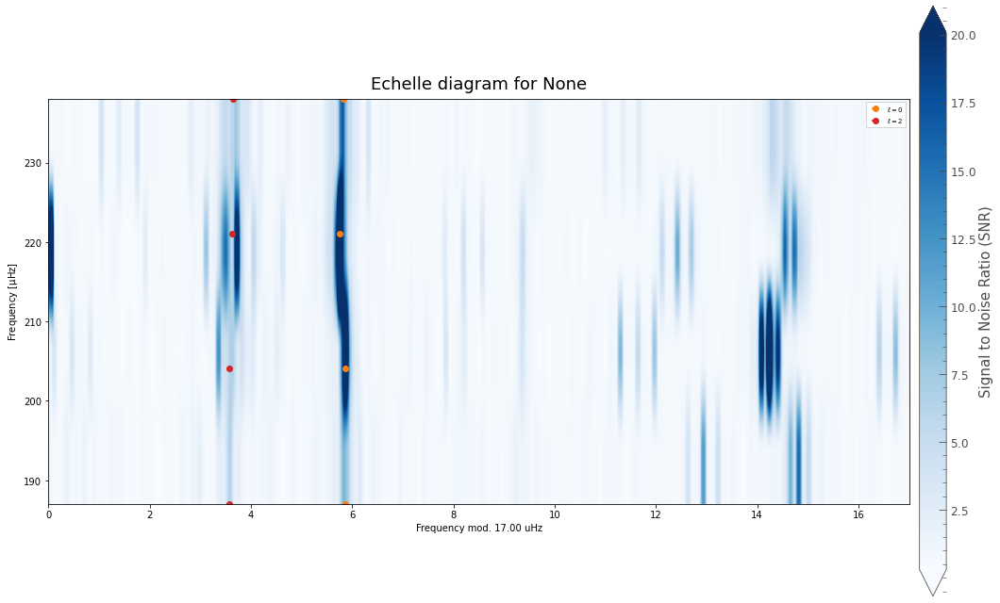

In [90]:
st = pb.star(ID, pg_mt_SNR, numax, dnu, teff, bp_rp)
st(norders = 7, make_plots=True)